In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
131,2021-05-18,12.582
132,2021-05-19,20.328
133,2021-05-20,1216.909
134,2021-05-21,5.713


Fecha
2021-01-28       0.000
2021-01-29       0.000
2021-01-30       1.242
2021-01-31       0.000
2021-02-01       0.992
                ...   
2021-06-08      12.582
2021-06-09      20.328
2021-06-10    1216.909
2021-06-11       5.713
2021-06-12       7.766
Name: Vacunas, Length: 136, dtype: float64

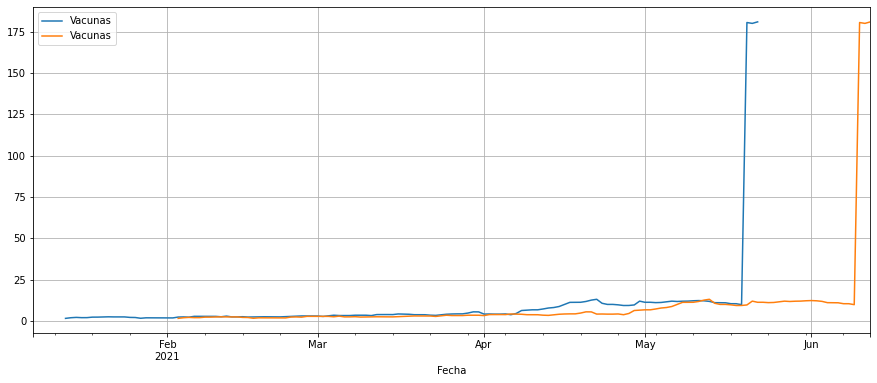

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

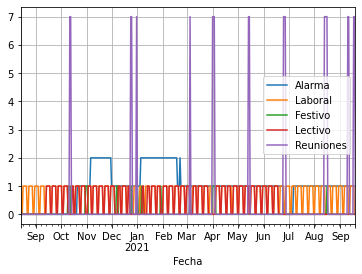

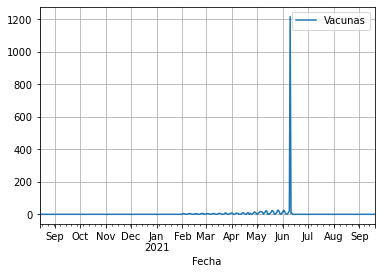

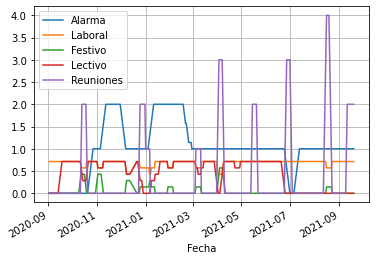

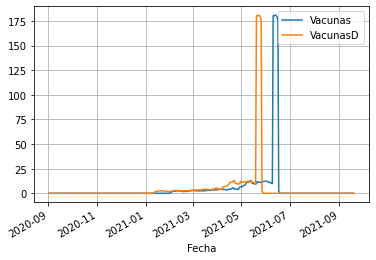

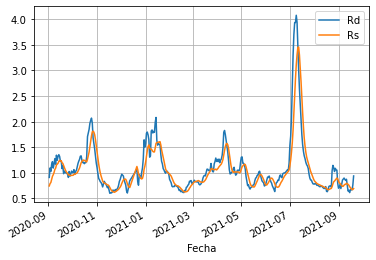

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-15,3,128,2352,2166.0,5.44,66.56,97,39,12,7,...,39.294095,87.836715,89.062536,81.307185,86.234599,89.140380,88.678329,89.270581,91.230167,89.080420
2021-09-16,4,86,1895,1981.0,4.54,50.74,60,9,9,6,...,39.294095,87.830197,89.057660,81.299919,86.230365,89.133898,88.672023,89.262097,91.226468,89.072442
2021-09-17,5,92,2004,2134.0,4.59,46.00,68,18,9,14,...,39.294095,87.823223,89.047906,81.292654,86.220486,89.128414,88.667173,89.259270,91.222770,89.061141
2021-09-18,6,61,1477,994.0,4.13,37.21,41,11,3,6,...,39.294095,87.818599,89.041945,81.290232,86.216252,89.124426,88.665718,89.256442,91.219811,89.051833
2021-09-19,7,51,913,947.0,5.59,29.07,27,5,6,2,...,39.294095,87.814734,89.039236,81.285388,86.214841,89.121434,88.661837,89.254745,91.218331,89.043855


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24
Día de la semana,1.000000,2.000000,3.000000,4.000000e+00,5.000000
Casos,89.000000,130.000000,83.000000,8.800000e+01,NaN
test coresp,2203.000000,2577.000000,2454.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,1938.000000,2000.000000,1969.000000,NaN,NaN
Tasa de positividad (%),4.040000,5.040000,3.380000,NaN,NaN
Asintomáticos,54.290000,74.100000,48.140000,5.808000e+01,NaN
Zaragoza,44.000000,105.000000,67.000000,6.200000e+01,NaN
1 a 14 años,15.000000,34.000000,18.000000,NaN,NaN
15 a 24 años,3.000000,5.000000,8.000000,NaN,NaN
25 a 34 años,9.000000,20.000000,9.000000,NaN,NaN


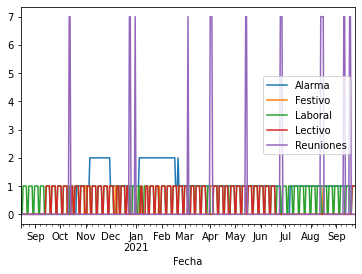

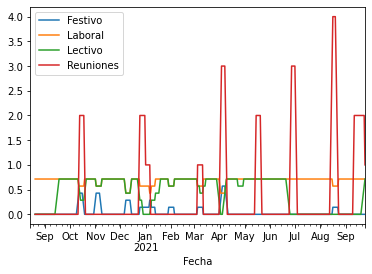

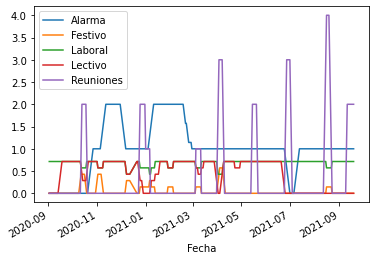

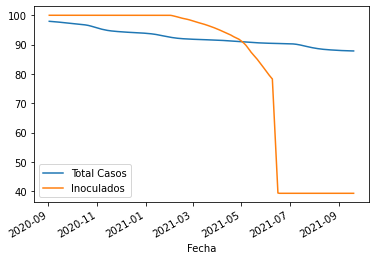

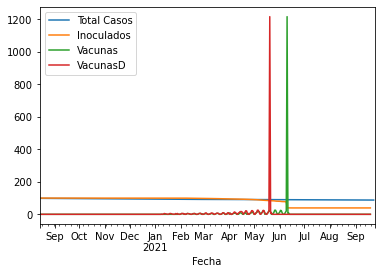

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

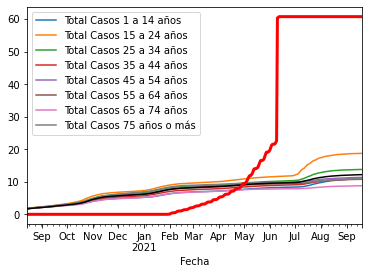

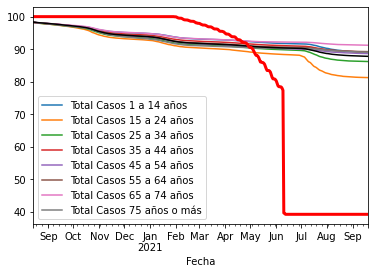

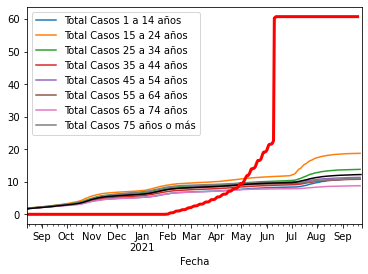

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.0
2020-08-15,98.300677,100.0
2020-08-16,98.271116,100.0
2020-08-17,98.241099,100.0
2020-08-18,98.205702,100.0
...,...,...
2021-09-20,87.807988,NaN
2021-09-21,87.798134,NaN
2021-09-22,87.791843,NaN


,Total Casos,Inoculados
Fecha,,
2021-09-20,87.807988,NaN
2021-09-21,87.798134,NaN
2021-09-22,87.791843,NaN
2021-09-23,87.785172,NaN
2021-09-24,NaN,NaN


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-20,1,89.0,2203.0,1938.0,4.04,54.29,44.0,15.0,3.0,9.0,...,NaN,87.807988,89.031107,81.282966,86.208490,89.118443,88.656502,89.247959,91.216112,89.024576
2021-09-21,2,130.0,2577.0,2000.0,5.04,74.10,105.0,34.0,5.0,20.0,...,NaN,87.798134,89.012683,81.278930,86.194377,89.110964,88.648256,89.242304,91.213893,89.007956
2021-09-22,3,83.0,2454.0,1969.0,3.38,48.14,67.0,18.0,8.0,9.0,...,NaN,87.791843,89.002929,81.272471,86.188026,89.104483,88.644861,89.236083,91.211673,89.000643
2021-09-23,4,88.0,NaN,NaN,NaN,58.08,62.0,NaN,NaN,NaN,...,NaN,87.785172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-24,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-20,1,89.0,2203.0,1938.0,4.04,54.29,44.0,15.0,3.0,9.0,...,91.216112,89.024576,17105.0,21079.0,17135.0,18416.0,19882.0,16006.0,9576.0,13952.0
2021-09-21,2,130.0,2577.0,2000.0,5.04,74.10,105.0,34.0,5.0,20.0,...,91.213893,89.007956,17139.0,21084.0,17155.0,18431.0,19899.0,16016.0,9579.0,13977.0
2021-09-22,3,83.0,2454.0,1969.0,3.38,48.14,67.0,18.0,8.0,9.0,...,91.211673,89.000643,17157.0,21092.0,17164.0,18444.0,19906.0,16027.0,9582.0,13988.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.839226,0.926324,0.915576,1.236058,0.813742,0.960909,0.771949,0.922558,0.720044,0.782331,...,1,1,1.000111,1.000204,1.000120,1.000094,1.000091,1.000085,1.000051,1.000063
2,1.194379,1.207547,0.986449,1.252695,1.163242,0.972167,1.195840,0.997807,1.259849,1.176382,...,1,1,1.000061,1.000129,1.000062,1.000040,1.000046,1.000035,1.000033,1.000044
3,1.190411,1.216950,0.983019,1.216727,1.176413,0.988389,1.211241,1.018268,1.209303,1.242583,...,1,1,1.000008,1.000014,1.000005,0.999989,0.999995,0.999990,1.000008,1.000022
4,1.204711,1.123382,1.078540,1.113841,1.230346,1.023501,1.213025,1.012994,1.211939,1.240083,...,1,1,0.999953,0.999893,0.999936,0.999954,0.999950,0.999958,0.999971,0.999962
5,1.130147,1.112223,1.025489,1.142350,1.086082,0.960930,1.135704,1.012847,1.174315,1.174731,...,1,1,0.999899,0.999790,0.999880,0.999913,0.999911,0.999922,0.999943,0.999936
6,0.853910,0.825095,1.045697,0.589460,0.938083,1.093176,0.895778,1.047990,0.922942,0.828166,...,1,1,0.999920,0.999865,0.999924,0.999952,0.999946,0.999955,0.999959,0.999949
7,0.548945,0.565666,0.957014,0.429192,0.554162,0.999549,0.541221,0.988616,0.469874,0.505587,...,1,1,1.000041,1.000088,1.000062,1.000051,1.000054,1.000048,1.000027,1.000019


Casos                                                0.994533
test coresp                                          0.996741
Tasa de positividad (%)                              0.998826
Nº de pacientes a los que se ha realizado pruebas    0.997189
Asintomáticos                                        0.994581
Asintomáticos (%)                                    0.999803
Zaragoza                                             0.994965
Zaragoza (%)                                         1.000154
1 a 14 años                                          0.995467
15 a 24 años                                         0.992838
25 a 34 años                                         0.992162
35 a 44 años                                         0.994102
45 a 54 años                                         0.996646
55 a 64 años                                         0.993661
65 a 74 años                                         0.994598
75 años o más                                        0.989494
Camas Oc

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-15    0.679397
2021-09-16    0.662778
2021-09-17    0.663355
2021-09-18    0.737745
2021-09-19    0.813072
Name: Casos, Length: 402, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-09-20         NaN
2021-09-21    1.460674
2021-09-22    0.638462
2021-09-23    1.060241
2021-09-24         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,1.155124,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,1.047753,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,0.531530,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,2139.714286,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,2164.571429,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,2109.428571,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,2229.857143,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,2277.000000,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-15,96.571429,1740.571429,5.402857,1641.285714,46.188571,47.714286,68.857143,72.798303,23.285714,9.142857,...,39.294095,87.858329,89.103874,81.328405,86.250830,89.167160,88.696760,89.283507,91.240841,89.092387
2021-09-16,89.285714,1763.857143,4.921429,1663.142857,42.477143,48.142857,63.142857,72.337552,21.714286,8.571429,...,39.294095,87.851561,89.092108,81.321486,86.245587,89.159111,88.690801,89.278983,91.237353,89.087828
2021-09-17,85.857143,1777.428571,4.708571,1772.857143,45.568571,52.285714,61.428571,73.044341,19.428571,7.857143,...,39.294095,87.845053,89.081580,81.315143,86.239841,89.151918,88.685188,89.274620,91.234077,89.082225


<AxesSubplot:xlabel='Fecha'>

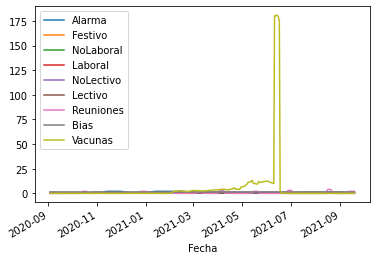

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 11.6 ms, sys: 2.56 ms, total: 14.2 ms
Wall time: 25.6 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.001288,0.000014,-0.010138,-0.000120,-0.000815,0.003601,-0.000650,-0.000052,-0.000329,0.000045,...,0.250806,0.031228,0.016808,-0.449102,-0.263164,-0.357306,-0.354960,-0.001362,-0.712266,-0.000015
2020-09-04,0.001215,0.000060,-0.004512,-0.000105,-0.000852,0.002770,-0.000508,0.000081,-0.001042,-0.000517,...,0.308936,0.026530,-0.017970,-2.574501,-2.503451,-2.537570,-2.540382,0.001194,-5.077952,0.000021
2020-09-05,0.001415,0.000004,-0.008197,-0.000053,-0.000924,0.004475,-0.000508,0.000032,-0.000417,-0.000015,...,0.202894,0.031502,0.030154,0.243247,0.376566,0.323100,0.296713,-0.002088,0.619813,0.000031
2020-09-06,0.000435,-0.000008,-0.009004,-0.000079,-0.000565,0.003296,0.000259,0.000001,0.000254,0.000482,...,0.253072,0.021380,0.043634,-0.580559,-0.440226,-0.504684,-0.516102,-0.002326,-1.020786,0.000018
2020-09-07,0.000414,-0.000027,-0.005041,-0.000004,-0.000196,0.000803,0.000675,0.000882,-0.000911,-0.000415,...,0.156117,0.015112,0.051304,-0.643269,-0.560366,-0.584039,-0.619596,-0.002720,-1.203635,0.000030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-15,0.000098,-0.000015,-0.002740,-0.000019,0.000500,-0.003226,-0.000724,0.002309,0.001340,0.000533,...,0.020795,-0.029171,-0.044602,-2.946801,-2.959400,-2.953865,-2.952336,0.007721,-5.906201,-0.000014
2021-09-16,-0.000068,0.000002,-0.000065,-0.000033,0.000629,-0.004401,-0.000791,0.002845,0.001609,0.000565,...,0.035597,-0.030859,-0.058595,-4.169919,-4.197024,-4.188113,-4.178830,0.007781,-8.366943,-0.000031
2021-09-17,-0.000199,0.000005,-0.001355,-0.000018,0.000410,-0.003275,-0.000692,0.001994,0.001653,0.000871,...,-0.020066,-0.021317,-0.056765,-3.211003,-3.236440,-3.223597,-3.223846,0.006907,-6.447443,-0.000014



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


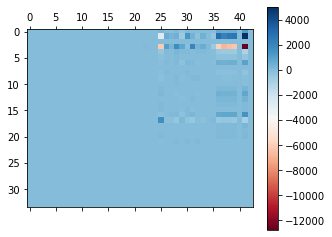

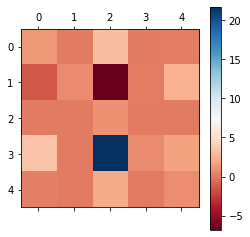

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(43, 374) = (43, 43)·(43, 43)·(43, 374)
CPU times: user 6.97 ms, sys: 976 µs, total: 7.95 ms
Wall time: 13.6 ms


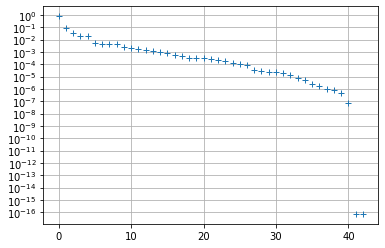

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$,$P_{42}$
Casos,-0.093495,0.238136,-0.206353,0.030316,0.669679,0.076526,-0.033411,0.041128,-0.048988,-0.329553,...,0.004255,0.000680,0.000248,0.000706,0.000002,0.000011,6.034879e-05,0.000010,1.378599e-17,8.428388e-18
test coresp,-0.691416,0.324844,-0.350215,-0.441447,-0.310954,-0.022944,0.001358,-0.010233,0.016934,-0.009921,...,0.000136,-0.000013,0.000044,-0.000001,0.000015,0.000026,-9.008032e-06,0.000003,4.044769e-19,1.498476e-19
Tasa de positividad (%),-0.002743,0.000002,-0.003543,0.001316,0.023010,-0.004789,0.004899,-0.009207,0.012608,-0.010714,...,0.015927,-0.004510,-0.004770,0.006656,0.003134,0.007218,-1.317195e-03,0.000385,-1.963622e-17,8.628981e-17
Nº de pacientes a los que se ha realizado pruebas,-0.629989,0.009052,0.406687,0.657539,0.013611,0.028178,0.022648,0.003537,-0.051388,0.018321,...,-0.000009,0.000033,-0.000002,0.000011,-0.000014,-0.000002,-8.178313e-06,-0.000001,-8.886417e-19,1.674250e-19
Asintomáticos,-0.047162,0.130246,-0.124444,-0.001122,0.341461,-0.081201,-0.089026,0.218273,-0.322104,0.561992,...,-0.001246,-0.000621,-0.000776,-0.000116,0.000206,0.000007,5.400491e-05,-0.000002,8.823075e-18,5.135324e-18
Asintomáticos (%),-0.010982,-0.022608,-0.002586,-0.012452,-0.001236,-0.008404,-0.008491,0.062076,-0.056073,0.036977,...,0.008409,-0.001697,0.001902,-0.000126,-0.000968,0.000505,-4.292969e-04,-0.000087,-2.656915e-17,-2.296256e-17
Zaragoza,-0.065436,0.149621,-0.144114,0.012207,0.400027,0.138077,0.033463,-0.206068,0.310124,0.120922,...,-0.003182,0.000649,-0.000459,-0.000429,-0.000488,-0.000002,-1.545422e-04,-0.000024,-9.989271e-18,9.004666e-19
Zaragoza (%),-0.016011,-0.042386,-0.000959,-0.001544,-0.037753,0.139073,-0.012428,-0.062834,0.138016,-0.025970,...,0.010608,0.000950,-0.002249,0.000520,0.000303,-0.000258,-3.060948e-04,0.000059,8.952385e-18,2.856039e-17
1 a 14 años,-0.011241,0.022312,-0.033812,-0.008450,0.034958,-0.060177,0.219706,0.142929,-0.288758,0.073768,...,-0.000277,-0.002507,-0.001796,0.000424,0.000599,-0.000165,5.621484e-04,-0.000038,-1.956531e-17,-1.907643e-17
15 a 24 años,-0.014349,0.034214,-0.166315,0.169458,0.100633,-0.624715,-0.179191,-0.001052,0.525292,-0.097058,...,-0.001903,-0.001340,-0.000166,-0.000631,-0.000127,-0.000080,1.961560e-04,-0.000032,-9.919783e-18,-1.548819e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 11.9 ms, sys: 426 µs, total: 12.3 ms
Wall time: 26.6 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 3.99 ms, sys: 2.56 ms, total: 6.55 ms
Wall time: 5.64 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.217043,-0.008871,2.818755,1.348291e-02,0.281258,-0.655347,-0.353740,0.166278,-1.195088,0.245610,...,-9.812483,-7.656707,-20.539879,-9.593700,9.052855,0.853162,-1.394007,1.435825,-0.540846,-9.973660e-03
test coresp,-2.572139,0.756257,-1.643689,1.883264e-01,3.482238,-4.749575,0.631846,-2.503976,-2.561485,2.097777,...,-17.819419,-20.612441,-12.482581,-0.317892,-2.004099,-26.498680,24.176689,1.716026,-2.321992,-2.021999e-01
Tasa de positividad (%),0.006035,0.000612,1.016780,-2.880601e-04,-0.004505,-0.025101,-0.008773,-0.000289,-0.016953,0.004562,...,0.185981,-0.436875,-0.469980,-0.330563,0.347014,0.182194,-0.165743,0.046633,0.016451,3.057906e-04
Nº de pacientes a los que se ha realizado pruebas,2.351135,-0.000028,19.988123,7.533542e-01,2.034356,-1.449312,-1.558010,3.430124,-4.580906,-0.651720,...,71.321892,76.779550,-32.260395,-24.659160,24.887208,-41.778879,42.006927,5.277228,0.228048,-4.705364e-01
Asintomáticos,0.122215,-0.017124,0.880090,2.221803e-02,0.944391,-0.092367,-0.035943,0.132171,-0.576034,0.255972,...,-5.530383,-4.081584,-5.598090,-2.085634,1.772615,2.243578,-2.556598,-0.444142,-0.313020,1.320153e-03
Asintomáticos (%),0.002868,0.000307,0.251593,1.916072e-03,0.000029,0.855542,0.019228,0.035583,-0.045614,0.005395,...,0.884900,0.578405,0.676345,0.269025,-0.261056,0.874638,-0.866670,-0.090821,0.007968,6.251929e-03
Zaragoza,0.333275,-0.007440,1.120892,1.087956e-02,0.163778,-0.189492,0.580786,0.254847,-0.792713,0.116270,...,-7.890178,-6.131386,-14.222173,-6.357389,5.894503,2.668061,-3.130947,0.669297,-0.462886,-4.217330e-03
Zaragoza (%),0.001907,-0.001625,-0.435380,1.651002e-04,-0.008337,0.027449,0.021454,0.863355,0.002148,-0.012787,...,0.481366,-0.010278,0.236558,-0.012787,0.046441,0.579623,-0.545969,-0.227609,0.033654,2.939296e-03
1 a 14 años,0.015239,-0.002010,0.539541,4.853932e-03,0.075366,-0.112518,-0.044986,0.098669,0.715632,0.005318,...,-1.164795,-0.747568,-1.806504,-0.679141,0.612445,0.590429,-0.657125,0.133254,-0.066696,1.750125e-04
15 a 24 años,0.029199,0.005131,0.980682,1.035093e-03,0.059709,-0.280709,-0.084525,-0.078888,-0.319482,0.950378,...,3.363086,-5.879649,-2.254435,-2.884618,3.251116,-0.749308,1.115806,0.854054,0.366499,-1.517825e-03


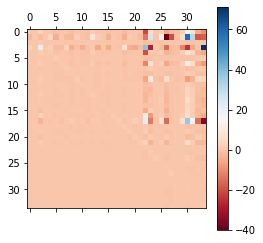

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.217043,-0.008871,2.818755,1.348291e-02,0.281258,-0.655347,-0.353740,0.166278,-1.195088,0.245610,...,0.087205,2.420048,-6.244552,-2.343733,-0.998274,2.409063,13.678339,6.307507,-4.848640,-9.812483
test coresp,-2.572139,0.756257,-1.643689,1.883264e-01,3.482238,-4.749575,0.631846,-2.503976,-2.561485,2.097777,...,-0.172974,10.863182,-40.076362,-20.382965,-1.321567,5.588769,58.667749,31.620527,-19.082202,-17.819419
Tasa de positividad (%),0.006035,0.000612,1.016780,-2.880601e-04,-0.004505,-0.025101,-0.008773,-0.000289,-0.016953,0.004562,...,0.002629,-0.067124,0.308577,0.066111,-0.038484,-0.016775,-0.384413,-0.204088,0.137058,0.185981
Nº de pacientes a los que se ha realizado pruebas,2.351135,-0.000028,19.988123,7.533542e-01,2.034356,-1.449312,-1.558010,3.430124,-4.580906,-0.651720,...,1.220188,-1.789478,-15.294030,-1.496371,-1.298216,-11.477309,-24.012683,-5.310423,-0.136931,71.321892
Asintomáticos,0.122215,-0.017124,0.880090,2.221803e-02,0.944391,-0.092367,-0.035943,0.132171,-0.576034,0.255972,...,0.072638,1.343628,-3.774536,-1.794367,-0.503010,1.226240,7.906742,3.843888,-2.688644,-5.530383
Asintomáticos (%),0.002868,0.000307,0.251593,1.916072e-03,0.000029,0.855542,0.019228,0.035583,-0.045614,0.005395,...,0.007370,-0.065566,-0.086036,-0.132238,-0.021223,-0.161003,-0.376459,-0.083930,0.072804,0.884900
Zaragoza,0.333275,-0.007440,1.120892,1.087956e-02,0.163778,-0.189492,0.580786,0.254847,-0.792713,0.116270,...,0.152782,1.971410,-5.877565,-1.804031,-0.559895,1.740106,11.548574,5.304170,-4.318587,-7.890178
Zaragoza (%),0.001907,-0.001625,-0.435380,1.651002e-04,-0.008337,0.027449,0.021454,0.863355,0.002148,-0.012787,...,0.044427,-0.128123,0.474981,-0.147088,-0.049116,-0.025264,-0.631894,-0.272535,0.423914,0.481366
1 a 14 años,0.015239,-0.002010,0.539541,4.853932e-03,0.075366,-0.112518,-0.044986,0.098669,0.715632,0.005318,...,-0.016561,0.318519,-0.796017,-0.598496,-0.100376,0.354041,1.797969,0.869822,-0.533422,-1.164795
15 a 24 años,0.029199,0.005131,0.980682,1.035093e-03,0.059709,-0.280709,-0.084525,-0.078888,-0.319482,0.950378,...,-0.047073,-1.407622,6.131162,0.223849,-0.681275,-0.278863,-7.497539,-3.707666,3.951624,3.363086


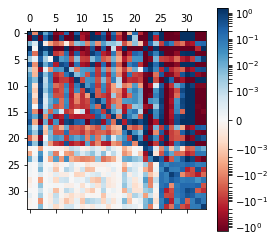

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(34, 374) = (34, 34)·(34, 34)·(34, 374)
CPU times: user 54 ms, sys: 3.4 ms, total: 57.4 ms
Wall time: 59.2 ms


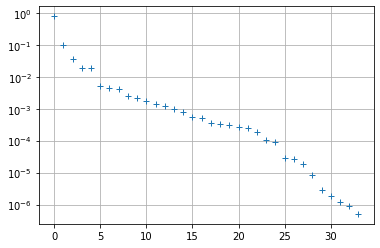

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.093464,0.238259,-0.206280,0.103099,-0.663224,0.064649,-0.031499,0.064510,-0.284495,0.283439,...,0.175355,0.019597,0.044837,0.008818,0.003290,0.007514,0.004504,0.000206,5.339636e-04,0.000271
test coresp,-0.691325,0.325219,-0.350190,-0.472745,0.260796,-0.021747,-0.000353,-0.020535,-0.006932,0.007482,...,-0.000404,-0.000666,0.004551,-0.000659,-0.000607,0.000201,0.000124,-0.000043,-9.453054e-07,-0.000019
Tasa de positividad (%),-0.002741,0.000023,-0.003524,0.003804,-0.022773,-0.003950,0.004166,-0.016157,-0.002664,0.040152,...,-0.034793,-0.157096,0.931579,-0.106053,-0.165613,0.043948,0.016706,0.004225,8.642705e-03,-0.005295
Nº de pacientes a los que se ha realizado pruebas,-0.630098,0.008358,0.406236,0.655038,0.058984,0.034072,0.023136,0.048412,0.021889,0.009052,...,0.000910,0.000327,-0.000048,0.000304,0.000026,-0.000089,-0.000060,-0.000017,1.587222e-05,-0.000002
Asintomáticos,-0.047136,0.130333,-0.124434,0.037771,-0.339532,-0.102623,-0.071746,0.385829,0.443319,-0.642605,...,-0.024598,0.014134,0.033419,-0.000060,-0.007839,0.000613,-0.001159,0.000515,2.788739e-05,-0.000328
Asintomáticos (%),-0.010982,-0.022613,-0.002595,-0.011973,0.000009,-0.015427,-0.002408,0.080027,-0.008373,-0.215046,...,0.026567,-0.096579,-0.073058,0.003272,0.019182,0.000402,0.008749,-0.001889,-3.222403e-04,0.000901
Zaragoza,-0.065407,0.149819,-0.143975,0.055818,-0.397003,0.152120,0.020252,-0.367690,0.124066,0.008836,...,0.005351,0.022109,-0.058444,-0.015767,0.004976,-0.004352,-0.003224,0.000825,-3.595688e-04,0.000201
Zaragoza (%),-0.016011,-0.042317,-0.000878,-0.005769,0.037064,0.140382,-0.015674,-0.147271,-0.080089,-0.216775,...,0.035355,-0.018578,0.160828,0.030754,-0.013804,0.005788,0.011404,0.002400,6.509295e-04,0.000047
1 a 14 años,-0.011242,0.022281,-0.033824,-0.005245,-0.035742,-0.062934,0.225126,0.310317,0.129993,0.317584,...,-0.177718,-0.085213,-0.124525,0.011248,0.001860,-0.004672,0.000687,0.001463,9.128910e-04,-0.000477
15 a 24 años,-0.014347,0.034217,-0.166252,0.182170,-0.080993,-0.657556,-0.163719,-0.481899,-0.127073,-0.083617,...,-0.164685,-0.035597,-0.065285,0.007394,-0.016366,-0.013775,-0.001748,-0.000413,-5.185098e-04,0.000108


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

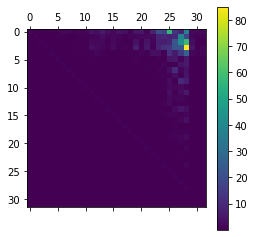

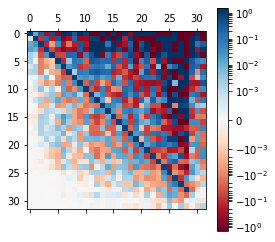

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

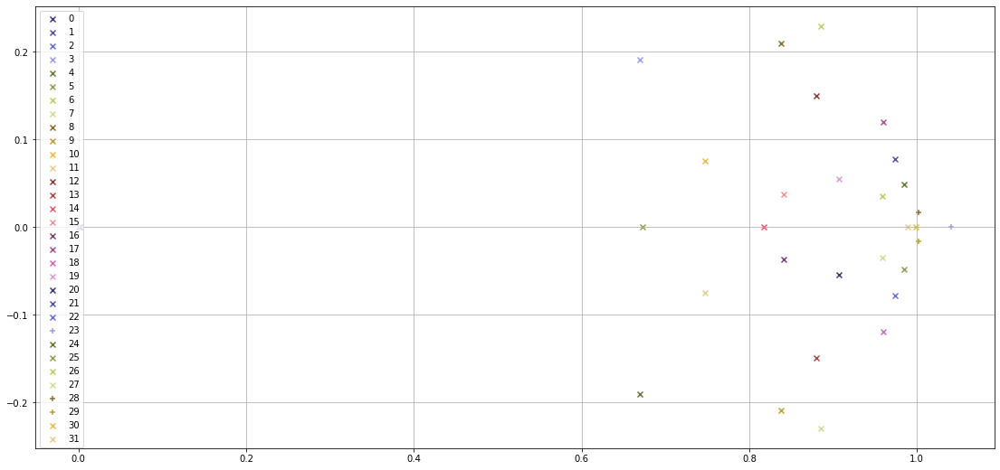

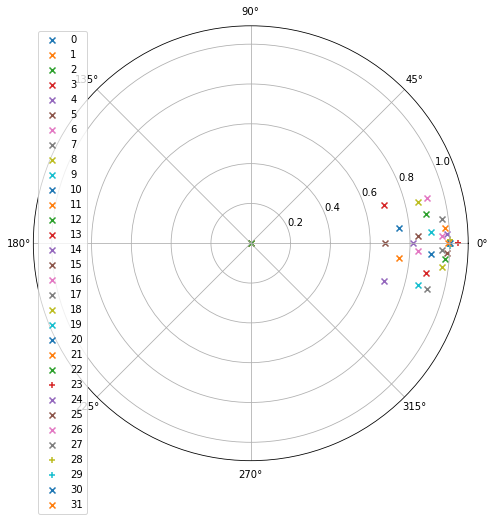

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-15,4.0,89.285714,1763.857143,1663.142857,4.921429,42.477143,63.142857,21.714286,8.571429,7.428571,...,39.294095,87.851561,89.092108,81.321486,86.245587,89.159111,88.690801,89.278983,91.237353,89.087828
2021-09-16,4.0,85.857143,1777.428571,1772.857143,4.708571,45.568571,61.428571,19.428571,7.857143,8.142857,...,39.294095,87.845053,89.081580,81.315143,86.239841,89.151918,88.685188,89.274620,91.234077,89.082225
2021-09-17,4.0,86.000000,1803.428571,1814.714286,4.637143,45.998571,60.142857,19.142857,7.714286,7.857143,...,39.294095,87.838534,89.071207,81.308915,86.234297,89.144796,88.680130,89.270257,91.230696,89.075861
2021-09-18,4.0,88.857143,1817.285714,1826.571429,4.892857,48.158571,60.428571,18.857143,8.285714,7.857143,...,39.294095,87.831799,89.060988,81.302226,86.228752,89.137602,88.674864,89.265814,91.227314,89.068738
2021-09-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-15,105.203348,1800.795067,5.565630,1611.110323,56.875964,50.077320,75.549788,72.837594,23.156758,11.545899,...,39.582634,87.879885,89.088969,81.315554,86.286724,89.161573,88.761540,89.280568,91.160510,89.061190
2021-09-16,94.353312,1759.272741,5.185965,1582.429625,50.821712,49.026332,66.177071,71.777911,20.860341,9.397286,...,39.499322,87.872920,89.076848,81.310633,86.278310,89.153716,88.755439,89.276102,91.159972,89.054240
2021-09-17,93.982301,1799.899618,5.135687,1588.107089,47.096517,47.127479,67.067390,72.640294,22.554044,9.230840,...,39.501949,87.866711,89.066282,81.303508,86.274437,89.146377,88.752114,89.271349,91.153798,89.052545
2021-09-18,87.377770,1823.373796,4.697416,1590.763131,44.773167,47.634677,62.000833,72.194777,20.932059,8.700085,...,39.486923,87.859322,89.051619,81.299214,86.265142,89.140003,88.743699,89.269751,91.154256,89.046823
2021-09-19,84.099547,1843.056707,4.417269,1664.854675,50.236640,51.502674,61.120387,72.810252,19.186062,7.724415,...,39.538116,87.849912,89.038928,81.292745,86.254712,89.132497,88.731872,89.270319,91.150409,89.035278


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,...,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,2.452841,1.261396,2.775749,-3.042955,4.096670,-1.191838,2.936831,-0.081799,2.255960,13.857132,...,0.556607,0.011843,-0.037440,-0.011836,0.022501,-0.013420,0.058732,0.009234,-0.072207,-0.036767
std,4.757670,2.867198,4.044724,3.998398,6.477914,3.077543,5.339976,1.751500,6.386089,13.989460,...,1.438224,0.008043,0.014962,0.015558,0.016033,0.009482,0.010051,0.012621,0.021083,0.012390
min,-13.819028,-8.996369,-10.543823,-16.233042,-12.872805,-9.119043,-12.964537,-8.362972,-17.169855,-21.496836,...,-0.224505,-0.007525,-0.076517,-0.042649,-0.012108,-0.036346,0.034396,-0.023376,-0.125328,-0.053370
25%,-0.264751,-0.346614,0.003863,-5.323350,-0.093016,-3.072722,-0.143224,-0.958822,-1.200137,3.454730,...,0.221939,0.007773,-0.047721,-0.020831,0.012076,-0.018944,0.053815,0.002105,-0.086743,-0.041482
50%,2.257887,1.082748,2.990958,-3.315725,3.581070,-1.404260,2.759590,-0.116375,1.855752,12.034516,...,0.310201,0.010900,-0.039239,-0.011443,0.022819,-0.014409,0.058768,0.009717,-0.071046,-0.037395
75%,5.060381,2.565560,5.504670,-1.095242,7.687815,0.469565,5.876297,0.833198,5.353844,24.494223,...,0.489166,0.015151,-0.028263,-0.005496,0.033592,-0.008441,0.063161,0.016540,-0.060700,-0.034304
max,19.805792,15.503033,15.723551,14.498851,27.013767,15.362199,22.646486,8.907801,24.663523,57.495467,...,15.202725,0.129361,0.040443,0.109032,0.163514,0.095270,0.189954,0.115585,0.035735,0.176307


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                                                 142.142857
test coresp                                          1835.000000
Tasa de positividad (%)                                 7.871429
Nº de pacientes a los que se ha realizado pruebas    1866.000000
Asintomáticos                                          80.177143
Asintomáticos (%)                                      57.428571
Zaragoza                                               96.142857
Zaragoza (%)                                           66.768663
1 a 14 años                                            24.714286
15 a 24 años                                           15.428571
25 a 34 años                                           11.571429
35 a 44 años                                           20.428571
45 a 54 años                                           18.857143
55 a 64 años                                           11.571429
65 a 74 años                                            7.571429
75 años o más            

Casos                                                 134.714286
test coresp                                          1772.571429
Tasa de positividad (%)                                 7.757143
Nº de pacientes a los que se ha realizado pruebas    1814.428571
Asintomáticos                                          76.827143
Asintomáticos (%)                                      57.857143
Zaragoza                                               91.285714
Zaragoza (%)                                           67.067695
1 a 14 años                                            22.142857
15 a 24 años                                           13.142857
25 a 34 años                                           12.285714
35 a 44 años                                           19.714286
45 a 54 años                                           19.285714
55 a 64 años                                           11.285714
65 a 74 años                                            6.714286
75 años o más            

Casos                                                 138.293598
test coresp                                          1881.224984
Tasa de positividad (%)                                 7.524583
Nº de pacientes a los que se ha realizado pruebas    1756.764804
Asintomáticos                                          81.309539
Asintomáticos (%)                                      55.861207
Zaragoza                                               93.459235
Zaragoza (%)                                           66.526705
1 a 14 años                                            24.139525
15 a 24 años                                           18.527276
25 a 34 años                                           12.801288
35 a 44 años                                           19.194169
45 a 54 años                                           16.114760
55 a 64 años                                            9.757973
65 a 74 años                                            6.024477
75 años o más            

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-09-12,1.0,0.0,0.0,0.0,0.0,31.0,0.0
2021-09-13,1.0,0.0,0.0,0.0,0.0,121.0,0.0
2021-09-14,1.0,0.0,0.0,0.0,0.0,83.0,0.0
2021-09-15,1.0,0.0,0.0,0.0,0.0,128.0,0.0
2021-09-16,1.0,0.0,0.0,0.0,0.0,86.0,0.0
2021-09-17,1.0,0.0,7.0,0.0,0.0,92.0,0.0
2021-09-18,1.0,0.0,7.0,0.0,0.0,61.0,0.0
2021-09-19,1.0,0.0,0.0,0.0,0.0,51.0,0.0
2021-09-20,0.0,0.0,0.0,NaN,NaN,89.0,1.0
2021-09-21,0.0,0.0,0.0,NaN,NaN,130.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,0.000000
2021-09-19,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,0.000000
2021-09-20,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,2.285714
2021-09-21,0.714286,0.0,0.285714,0.714286,0.714286,0.285714,2.0,1.0,4.571429
2021-09-22,0.571429,0.0,0.285714,0.714286,0.571429,0.428571,2.0,1.0,6.857143
2021-09-23,0.428571,0.0,0.285714,0.714286,0.428571,0.571429,2.0,1.0,9.142857
2021-09-24,0.285714,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,11.428571
2021-09-25,0.142857,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,13.714286
2021-09-26,0.000000,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,16.000000
2021-09-27,0.000000,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,16.000000


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,0.0
2021-09-19,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,0.0
2021-09-20,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,2.0
2021-09-21,0.714286,0.0,0.285714,0.714286,0.714286,0.285714,2.0,1.0,4.0
2021-09-22,0.571429,0.0,0.285714,0.714286,0.571429,0.428571,2.0,1.0,6.0
2021-09-23,0.428571,0.0,0.285714,0.714286,0.428571,0.571429,2.0,1.0,8.0
2021-09-24,0.285714,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,10.0
2021-09-25,0.142857,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,12.0
2021-09-26,0.000000,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,14.0
2021-09-27,0.000000,0.0,0.285714,0.714286,0.285714,0.714286,2.0,1.0,14.0


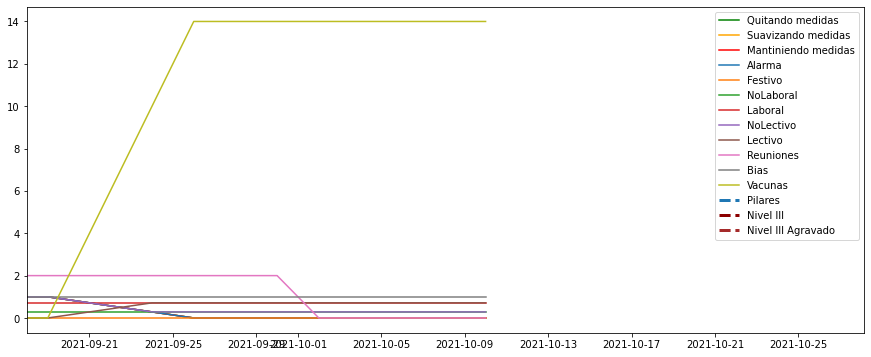

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 9.78 µs


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857142,1817.285714,4.892809,1826.571428,48.158572,54.571422,60.428570,66.783744,18.857147,8.285716,...,39.294092,87.834498,89.059991,81.301373,86.228312,89.143153,88.670552,89.267793,91.224099,89.068337
2021-09-19,92.551541,1850.664893,5.101680,1654.189525,53.313389,53.730239,65.081882,67.462311,18.365059,14.261866,...,39.181536,87.823802,89.063067,81.276336,86.217447,89.128875,88.668425,89.248837,91.195710,89.053244
2021-09-20,94.770353,1850.346087,5.400061,1534.251839,53.544026,52.706449,68.331733,68.015958,16.954293,21.565335,...,39.099482,87.812038,89.054203,81.252228,86.204860,89.117918,88.661059,89.238927,91.184931,89.037032
2021-09-21,97.666000,1840.724592,5.729125,1470.823159,51.172053,51.391714,71.368455,68.324678,15.032093,30.235338,...,39.046878,87.800844,89.045629,81.222511,86.191413,89.108607,88.654077,89.232471,91.176702,89.022286
2021-09-22,102.960365,1833.796294,6.083048,1453.496393,48.489031,49.937205,75.591195,68.424291,13.051228,40.010671,...,39.024189,87.790061,89.037695,81.185346,86.178170,89.100708,88.647988,89.228183,91.169992,89.008793
2021-09-23,111.507654,1836.833781,6.454676,1471.958613,46.956012,48.447874,81.651090,68.335437,11.288946,50.587303,...,39.029863,87.779467,89.030259,81.139944,86.164454,89.093670,88.642786,89.225720,91.164559,88.996161
2021-09-24,123.612859,1853.759220,6.837093,1517.131611,47.400759,46.987147,89.735602,68.068496,9.904297,61.672728,...,39.061608,87.768726,89.023068,81.085828,86.149491,89.087030,88.638345,89.224681,91.160239,88.984004
2021-09-25,139.264375,1886.208621,7.224813,1581.572825,50.201896,45.585258,99.776185,67.628319,8.978508,73.017728,...,39.117083,87.757465,89.015819,81.022760,86.132521,89.080382,88.634455,89.224647,91.156910,88.971971
2021-09-26,158.614543,1927.081623,7.664221,1647.506115,56.128354,44.497176,112.418048,67.178673,8.720659,84.165318,...,39.196798,87.745376,89.008990,80.950631,86.114677,89.073987,88.631793,89.224173,91.153760,88.960593
2021-09-27,181.090436,1975.248811,8.147828,1711.809907,64.849841,43.667778,127.101758,66.705263,9.056015,94.934210,...,39.297817,87.732206,89.002027,80.870379,86.093761,89.067039,88.629570,89.223840,91.151170,88.949413


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857142,1817.285714,4.892809,1826.571428,48.158572,54.571422,60.428570,66.783744,18.857147,8.285716,...,39.294092,87.834498,89.059991,81.301373,86.228312,89.143153,88.670552,89.267793,91.224099,89.068337
2021-09-19,84.894833,1830.052452,4.664802,1730.969075,49.231806,54.308644,58.950496,67.452035,17.617491,8.382216,...,39.166350,87.823272,89.044856,81.297404,86.204637,89.135347,88.663480,89.261072,91.224252,89.054243
2021-09-20,78.540040,1824.689487,4.461551,1655.833742,46.683729,53.907177,55.555420,68.009037,16.030083,8.466287,...,39.026290,87.813726,89.034873,81.287531,86.194801,89.126515,88.656934,89.253182,91.218499,89.039928
2021-09-21,71.742832,1816.576447,4.300022,1599.354547,41.758054,53.101019,51.292750,68.342280,14.253422,9.627226,...,38.825989,87.804881,89.027448,81.274999,86.186012,89.117801,88.650953,89.245708,91.210120,89.025045
2021-09-22,65.743644,1807.798814,4.196216,1561.774915,35.549904,51.978924,47.188216,68.490686,12.421780,12.048104,...,38.578199,87.796416,89.020505,81.259825,86.177627,89.109983,88.645354,89.239196,91.201782,89.009793
2021-09-23,61.545506,1800.419522,4.162313,1541.602915,29.068754,50.624960,44.034690,68.482544,10.629761,15.849955,...,38.293470,87.788407,89.014088,81.240959,86.169593,89.102905,88.640407,89.233884,91.193640,88.994515
2021-09-24,59.952597,1796.447437,4.207023,1536.658713,23.179273,49.110934,42.432593,68.335747,8.944154,21.114876,...,37.980743,87.780795,89.008177,81.217307,86.161657,89.096395,88.636277,89.229883,91.185834,88.979400
2021-09-25,61.615664,1797.838489,4.336255,1544.717694,18.586462,47.493427,42.837264,68.059546,7.414032,27.901697,...,37.647696,87.773415,89.002712,81.187745,86.153419,89.090271,88.633031,89.227201,91.178482,88.964535
2021-09-26,67.395058,1799.252865,4.603655,1551.882606,16.531298,46.062529,46.431123,67.817630,6.256676,35.989596,...,37.303518,87.766094,88.998387,81.151072,86.146204,89.084950,88.631576,89.224718,91.170976,88.950771
2021-09-27,77.402410,1802.172687,5.005382,1557.901367,17.203627,44.800289,53.150955,67.590960,5.432888,45.363145,...,36.952617,87.758624,88.994828,81.106994,86.137837,89.079734,88.631305,89.223247,91.163866,88.937893


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857142,1817.285714,4.892809,1826.571428,48.158572,54.571422,60.428570,66.783744,18.857147,8.285716,...,39.294092,87.834498,89.059991,81.301373,86.228312,89.143153,88.670552,89.267793,91.224099,89.068337
2021-09-19,84.894833,1830.052452,4.664802,1730.969075,49.231806,54.308644,58.950496,67.452035,17.617491,8.382216,...,39.166350,87.823272,89.044856,81.297404,86.204637,89.135347,88.663480,89.261072,91.224252,89.054243
2021-09-20,78.540040,1824.689487,4.461551,1655.833742,46.683729,53.907177,55.555420,68.009037,16.030083,8.466287,...,39.026290,87.813726,89.034873,81.287531,86.194801,89.126515,88.656934,89.253182,91.218499,89.039928
2021-09-21,71.745682,1816.634219,4.299935,1599.488986,41.757676,53.099233,51.293954,68.341440,14.253372,9.627659,...,38.833436,87.804879,89.027450,81.274996,86.186013,89.117804,88.650953,89.245705,91.210114,89.025044
2021-09-22,65.753997,1807.985853,4.196018,1562.150686,35.550685,51.973941,47.193818,68.488605,12.421925,12.050061,...,38.600289,87.796412,89.020508,81.259813,86.177633,89.109988,88.645355,89.239188,91.201765,89.009785
2021-09-23,61.569105,1800.813280,4.162043,1542.307993,29.073014,50.615638,44.049345,68.479201,10.630478,15.855195,...,38.337177,87.788398,89.014091,81.240929,86.169611,89.102914,88.640407,89.233868,91.193607,88.994493
2021-09-24,59.996009,1797.127496,4.206773,1537.769102,23.189578,49.096331,42.462249,68.331459,8.945888,21.125778,...,38.052843,87.780776,89.008179,81.217251,86.161690,89.096408,88.636278,89.229856,91.185777,88.979356
2021-09-25,61.686228,1798.885098,4.336164,1546.302408,18.605457,47.472763,42.889126,68.054932,7.417291,27.921131,...,37.754787,87.773384,89.002711,81.187649,86.153472,89.090289,88.633033,89.227161,91.178395,88.964459
2021-09-26,67.500887,1800.746741,4.603898,1554.006847,16.561727,46.035164,46.513640,67.813584,6.262053,36.020736,...,37.452040,87.766046,88.998381,81.150922,86.146280,89.084973,88.631581,89.224662,91.170850,88.950653
2021-09-27,77.552359,1804.195317,5.006158,1560.628234,17.248429,44.765718,53.273759,67.588621,5.441093,45.409238,...,37.148870,87.758554,88.994814,81.106773,86.137938,89.079764,88.631314,89.223172,91.163693,88.937721


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857142,1817.285714,4.892809,1826.571428,48.158572,54.571422,60.428570,66.783744,18.857147,8.285716,...,39.294092,87.834498,89.059991,81.301373,86.228312,89.143153,88.670552,89.267793,91.224099,89.068337
2021-09-19,84.894833,1830.052452,4.664802,1730.969075,49.231806,54.308644,58.950496,67.452035,17.617491,8.382216,...,39.166350,87.823272,89.044856,81.297404,86.204637,89.135347,88.663480,89.261072,91.224252,89.054243
2021-09-20,78.540040,1824.689487,4.461551,1655.833742,46.683729,53.907177,55.555420,68.009037,16.030083,8.466287,...,39.026290,87.813726,89.034873,81.287531,86.194801,89.126515,88.656934,89.253182,91.218499,89.039928
2021-09-21,71.739982,1816.518676,4.300110,1599.220108,41.758431,53.102805,51.291545,68.343119,14.253472,9.626792,...,38.818543,87.804882,89.027447,81.275002,86.186012,89.117799,88.650952,89.245711,91.210125,89.025047
2021-09-22,65.733290,1807.611776,4.196414,1561.399144,35.549123,51.983908,47.182614,68.492766,12.421635,12.046148,...,38.556109,87.796421,89.020503,81.259838,86.177621,89.109977,88.645353,89.239204,91.201798,89.009801
2021-09-23,61.521908,1800.025764,4.162583,1540.897837,29.064495,50.634282,44.020035,68.485887,10.629044,15.844714,...,38.249762,87.788417,89.014085,81.240988,86.169576,89.102896,88.640406,89.233901,91.193674,88.994537
2021-09-24,59.909185,1795.767378,4.207273,1535.548324,23.168968,49.125537,42.402937,68.340036,8.942420,21.103974,...,37.908644,87.780813,89.008176,81.217364,86.161623,89.096382,88.636276,89.229910,91.185890,88.979444
2021-09-25,61.545100,1796.791880,4.336345,1543.132980,18.567466,47.514092,42.785402,68.064160,7.410772,27.882263,...,37.540606,87.773446,89.002714,81.187841,86.153367,89.090253,88.633028,89.227241,91.178570,88.964611
2021-09-26,67.289229,1797.758990,4.603412,1549.758365,16.500869,46.089894,46.348607,67.821676,6.251299,35.958456,...,37.154996,87.766141,88.998394,81.151222,86.146129,89.084926,88.631571,89.224774,91.171102,88.950890
2021-09-27,77.252460,1800.150058,5.004606,1555.174500,17.158825,44.834860,53.028150,67.593299,5.424683,45.317052,...,36.756363,87.758693,88.994841,81.107215,86.137735,89.079704,88.631295,89.223322,91.164038,88.938065


CPU times: user 196 ms, sys: 9.39 ms, total: 206 ms
Wall time: 299 ms


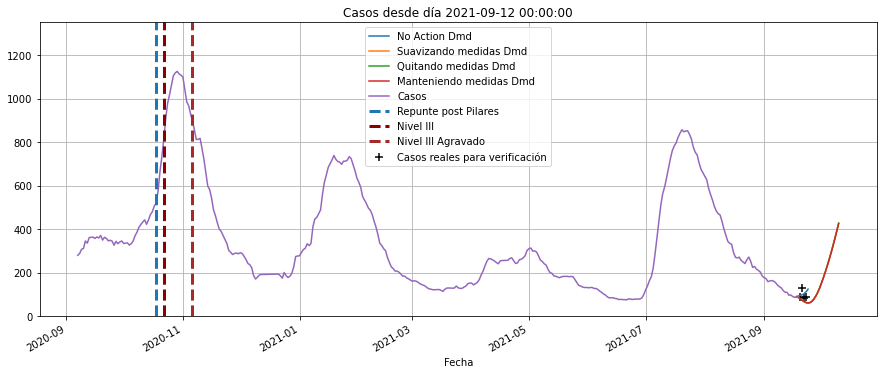

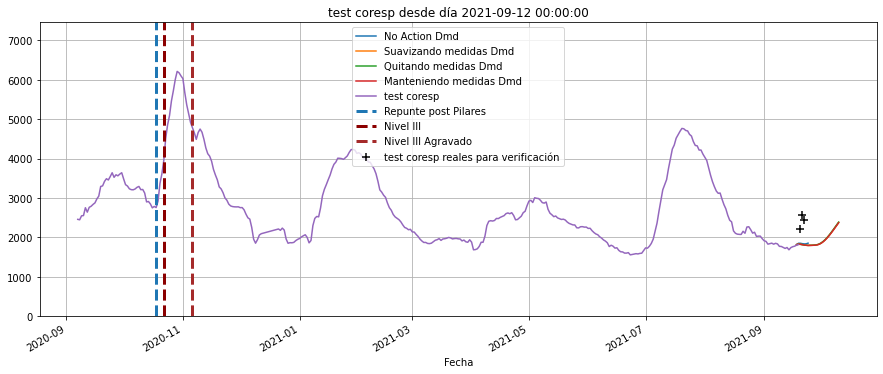

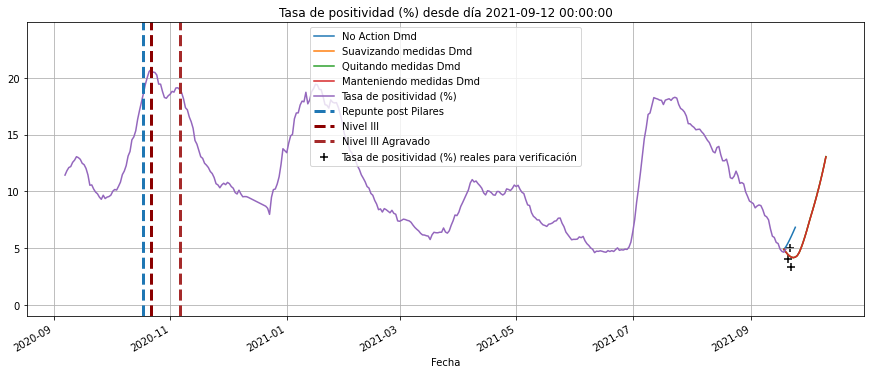

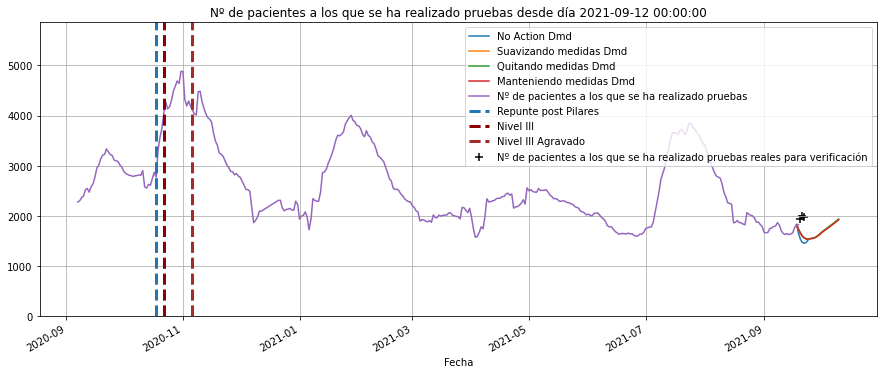

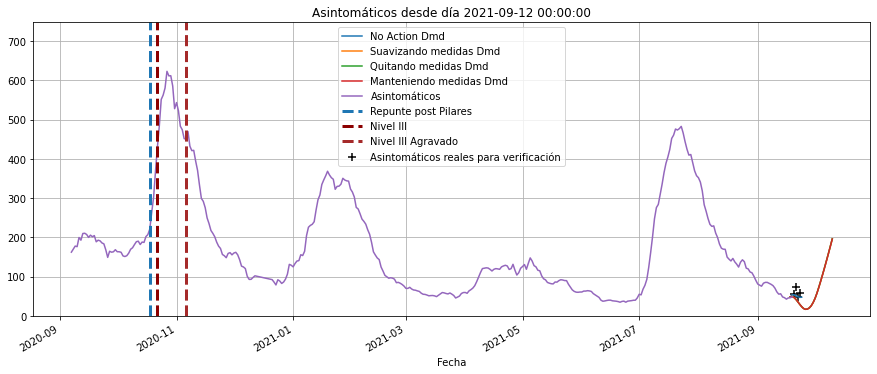

...

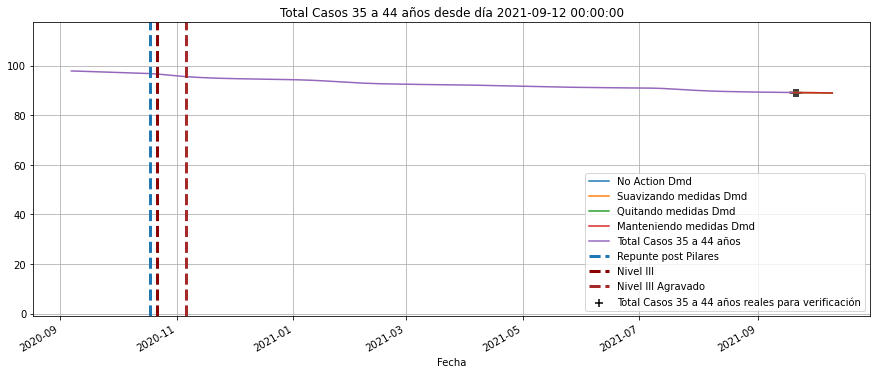

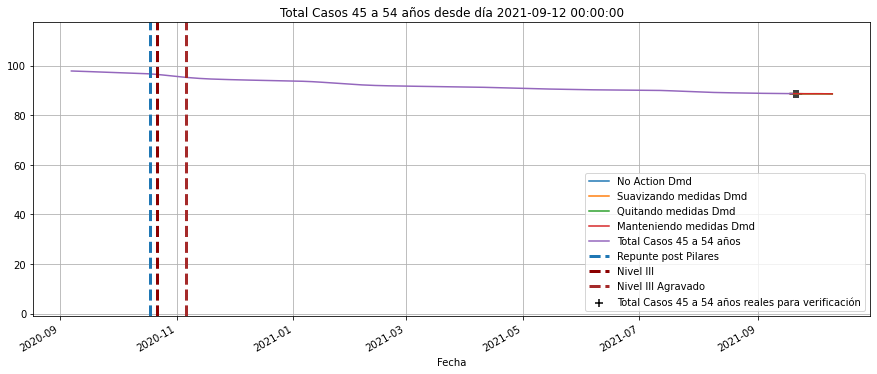

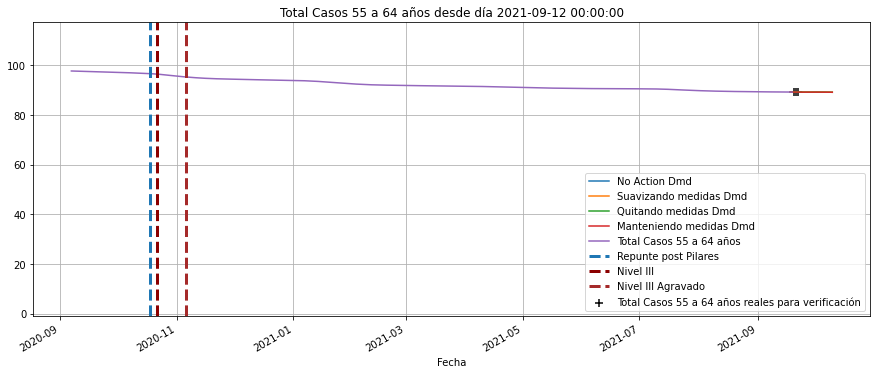

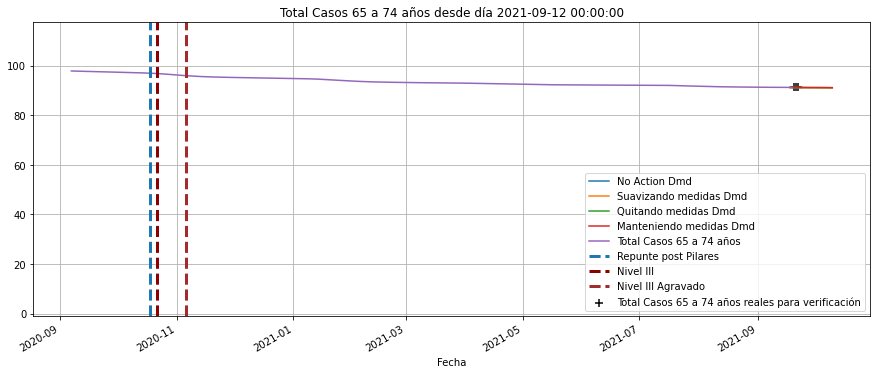

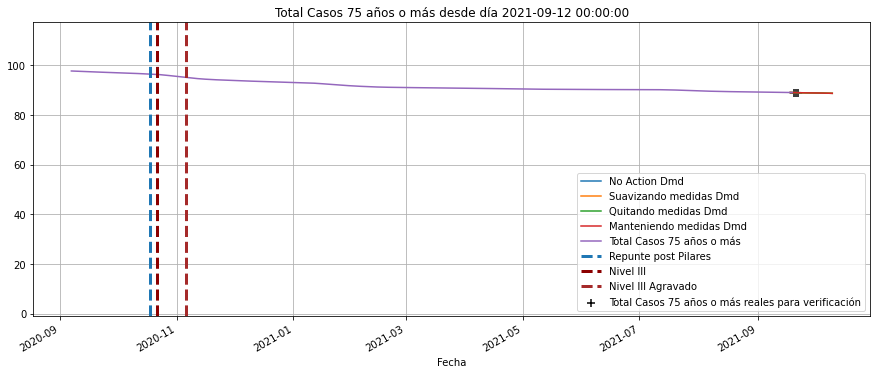

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

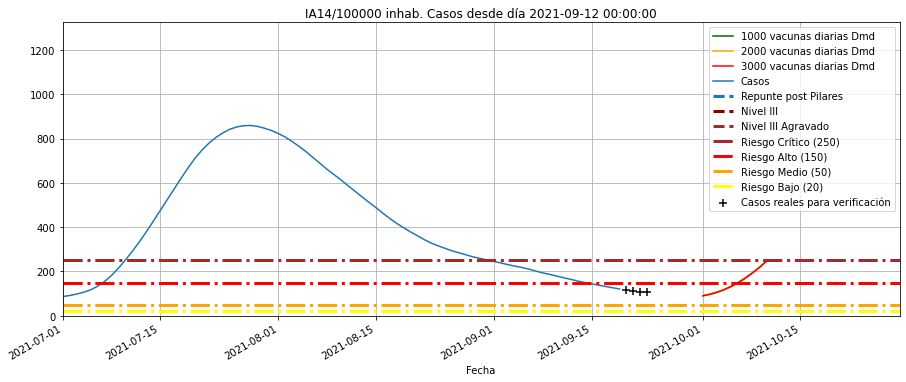

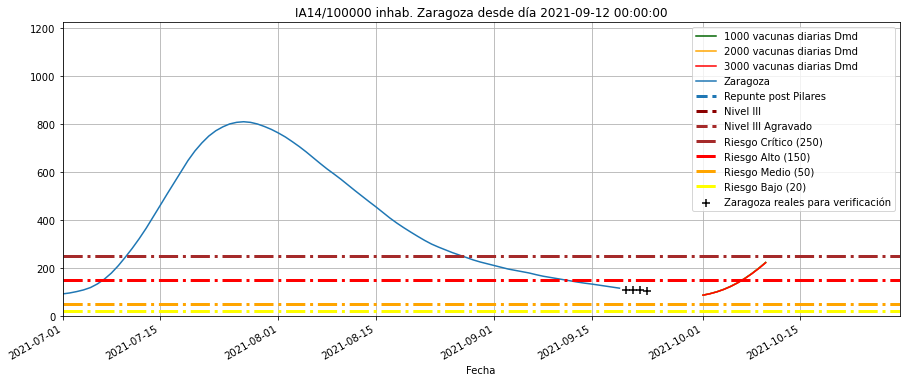

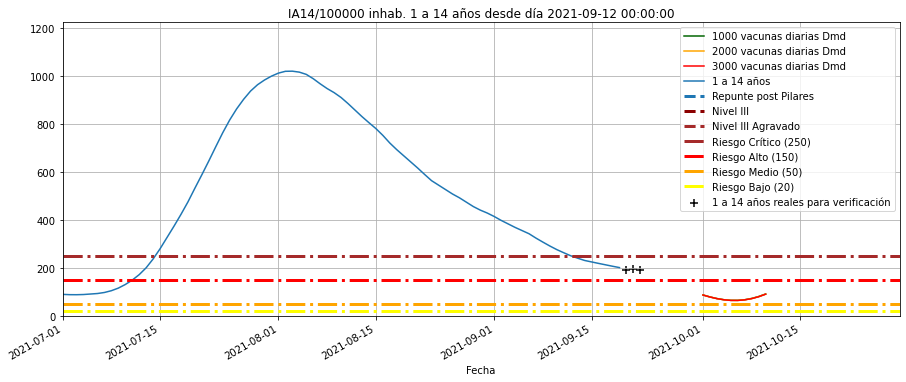

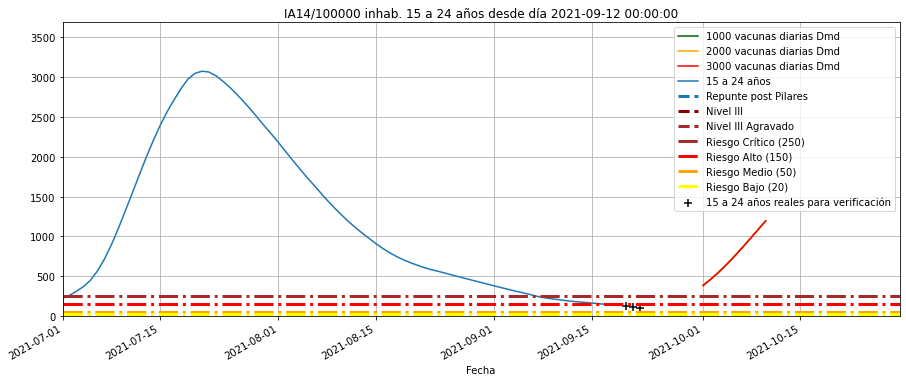

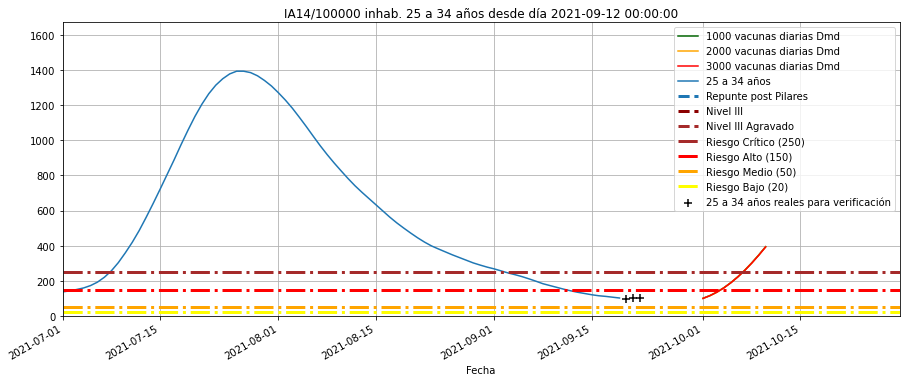

...

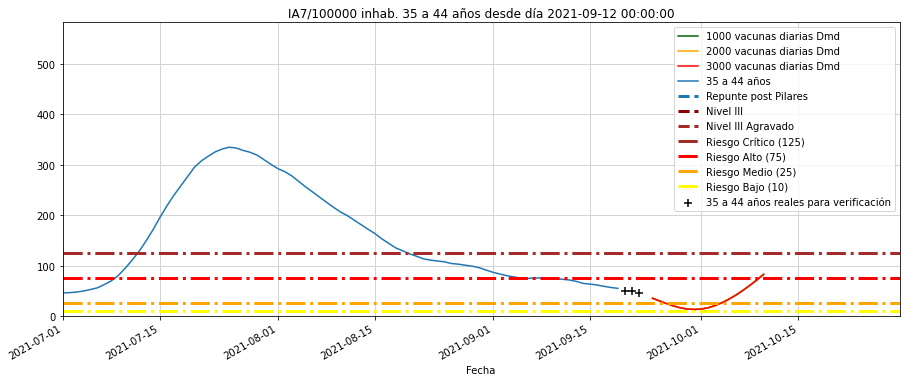

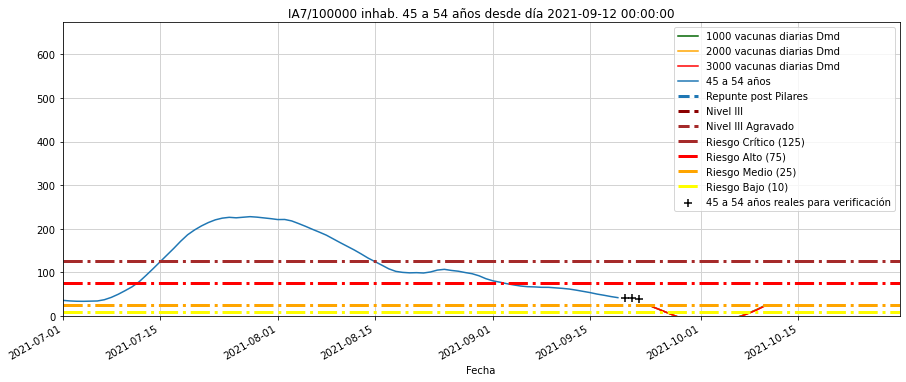

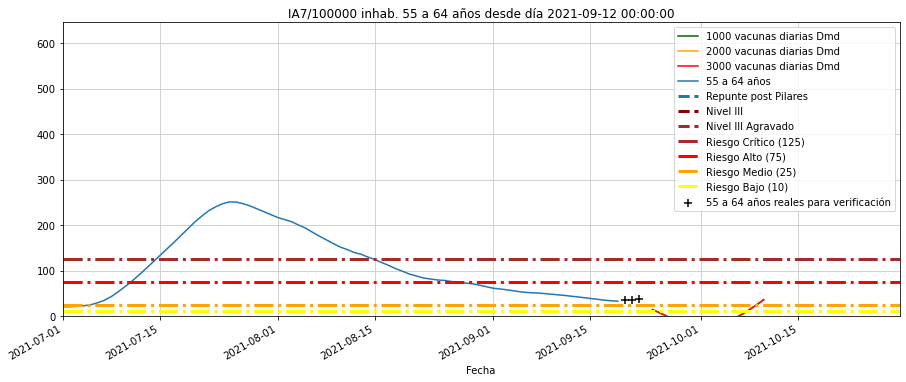

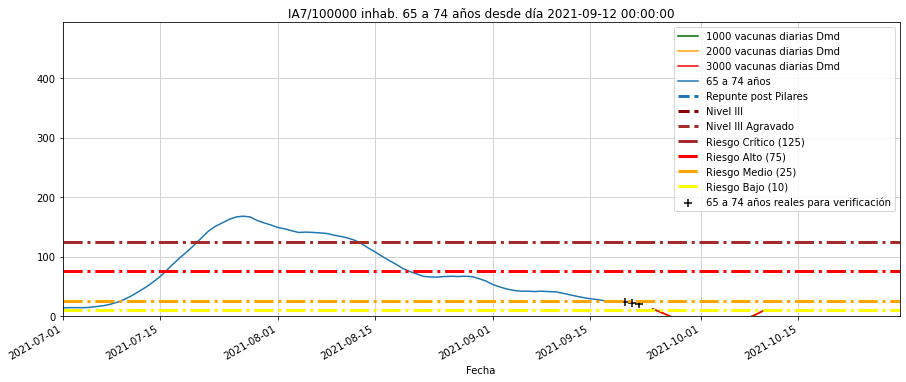

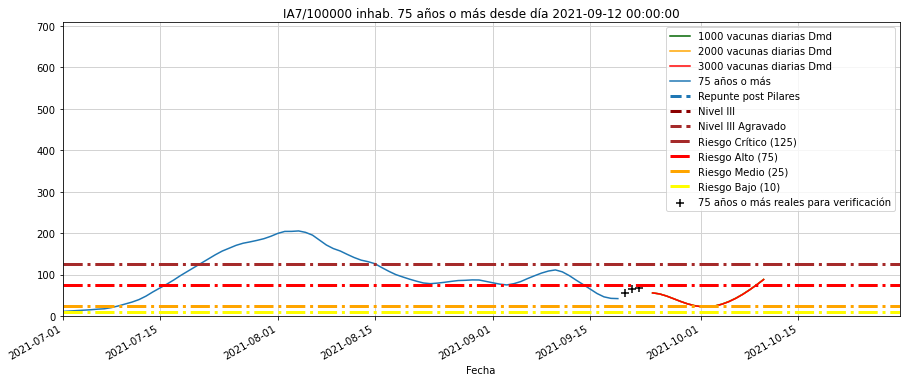

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-20,1,89.0,2203.0,1938.0,4.04,54.29,44.0,15.0,3.0,9.0,...,NaN,87.807988,89.031107,81.282966,86.208490,89.118443,88.656502,89.247959,91.216112,89.024576
2021-09-21,2,130.0,2577.0,2000.0,5.04,74.10,105.0,34.0,5.0,20.0,...,NaN,87.798134,89.012683,81.278930,86.194377,89.110964,88.648256,89.242304,91.213893,89.007956
2021-09-22,3,83.0,2454.0,1969.0,3.38,48.14,67.0,18.0,8.0,9.0,...,NaN,87.791843,89.002929,81.272471,86.188026,89.104483,88.644861,89.236083,91.211673,89.000643
2021-09-23,4,88.0,NaN,NaN,NaN,58.08,62.0,NaN,NaN,NaN,...,NaN,87.785172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-24,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

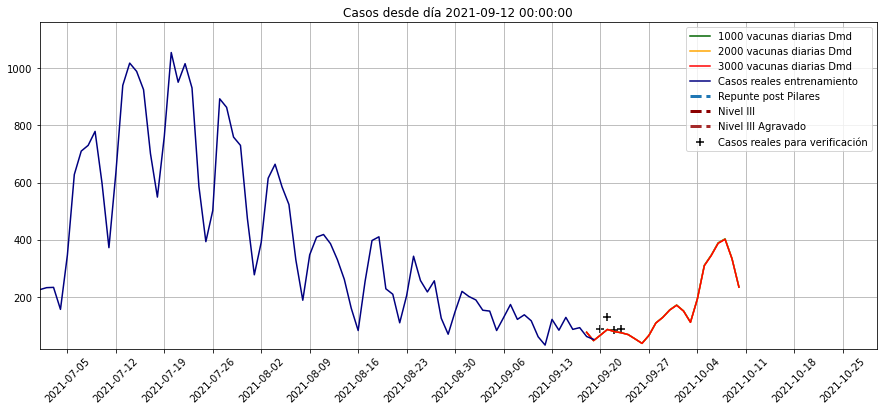

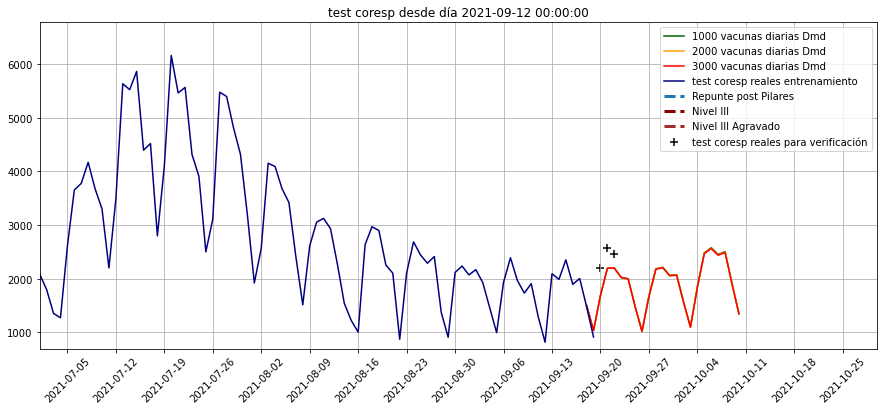

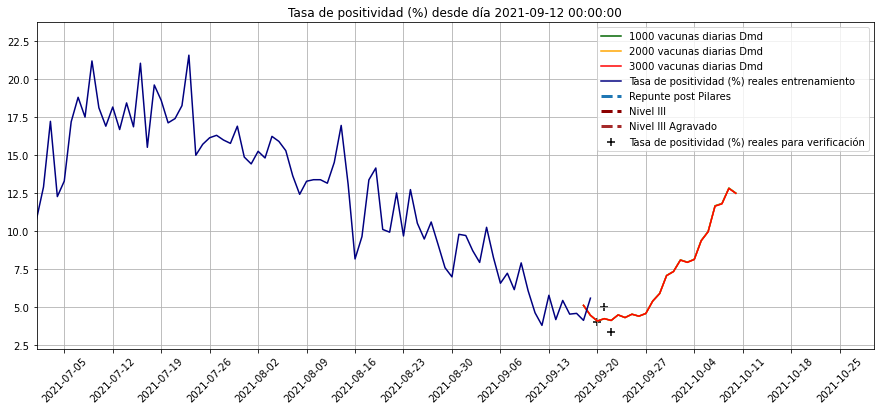

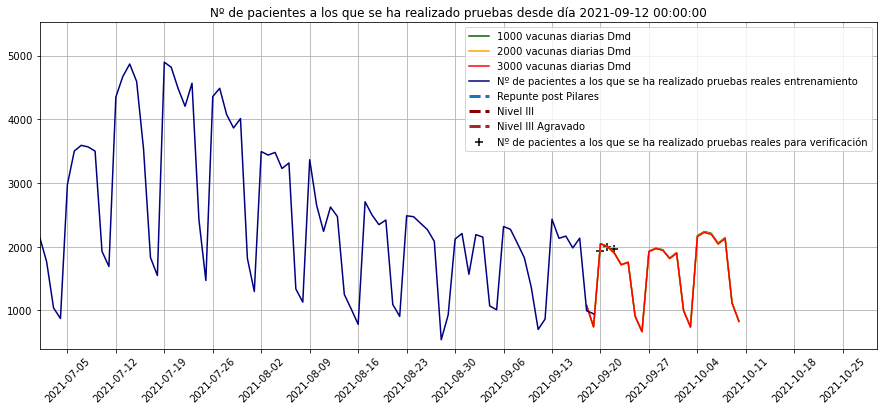

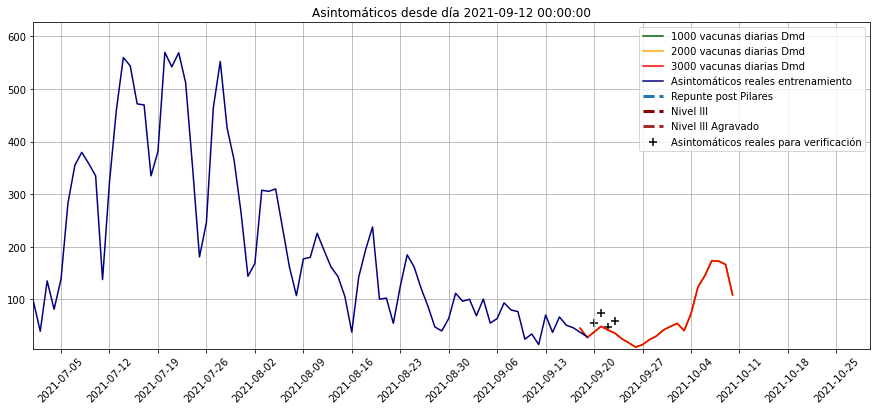

...

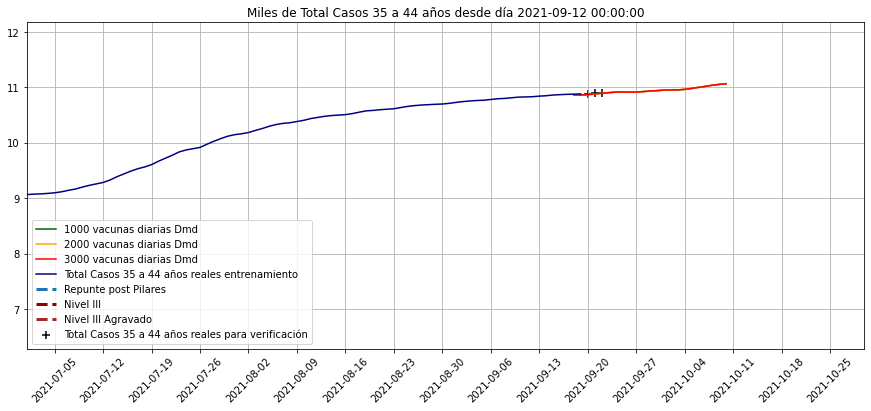

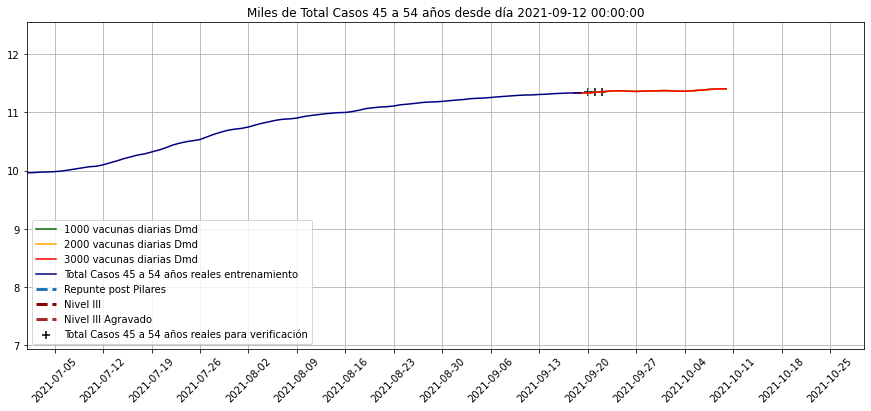

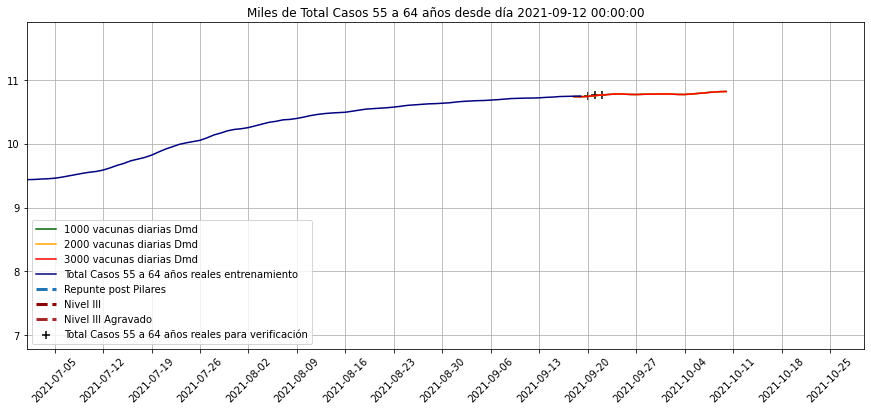

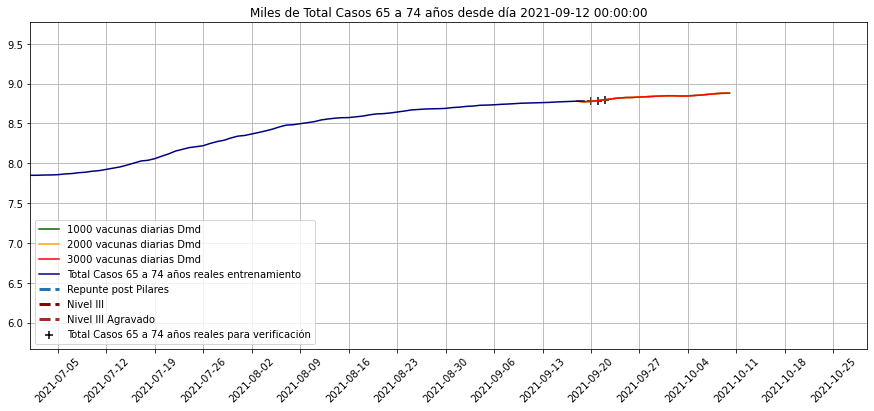

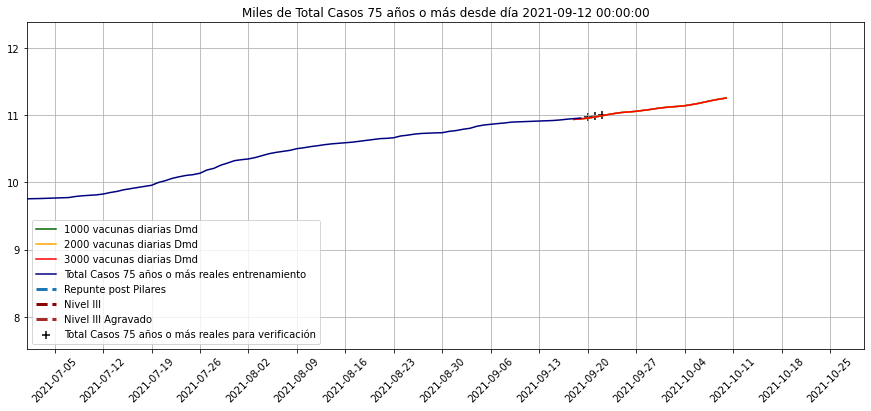

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-9-26'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-9-26'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-09-26,37,1018,666,4,46,25,20,117,83,1590,3,18,4,2,-2,-3,-2,4
2021-09-25,53,1483,911,5,52,38,21,107,87,1620,7,23,5,3,-2,-3,-2,7
2021-09-24,68,1998,1755,4,47,48,22,106,93,1599,11,25,6,6,0,-2,-1,10
2021-09-23,74,2023,1717,4,52,53,23,103,103,1450,13,20,6,8,3,0,1,13
2021-09-22,78,2200,1900,4,51,57,24,103,111,1407,15,15,6,10,5,3,2,13
2021-09-21,86,2194,2004,4,52,61,26,103,121,1401,18,11,6,13,8,5,3,16
2021-09-20,66,1690,2047,4,52,43,28,104,131,1427,12,7,5,10,7,5,3,11


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,75.875962,1499.434225,5.116397,1076.690933,45.176718,59.656151,54.130588,69.988693,17.404057,6.861946,...,39.294092,87.834498,89.052822,81.290362,86.221719,89.138887,88.665761,89.263782,91.220402,89.063802
2021-09-19,46.602587,1035.197560,4.464282,742.918633,27.282378,54.284159,31.905266,66.684149,8.277999,4.237937,...,39.166350,87.823272,89.048530,81.304561,86.209946,89.139899,88.668244,89.265337,91.226707,89.055937
2021-09-20,65.912837,1690.253484,4.084889,2046.706859,37.988520,51.799884,42.885928,62.742265,11.542359,6.623442,...,39.026290,87.813726,89.044715,81.304150,86.205179,89.134868,88.665008,89.260745,91.223114,89.045499
2021-09-21,85.688156,2193.602317,4.241754,2003.502775,48.574714,51.623053,61.337897,68.192402,17.957156,11.325298,...,38.825989,87.804881,89.032860,81.285480,86.191395,89.121354,88.654992,89.248855,91.213175,89.028920
2021-09-22,78.261984,2200.001270,4.124962,1900.253499,41.821352,51.375410,57.156289,69.741891,15.021691,14.970769,...,38.578199,87.796416,89.021225,81.260947,86.178041,89.109042,88.644874,89.238316,91.202523,89.011720


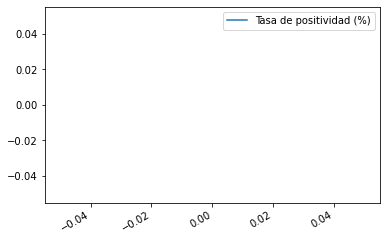

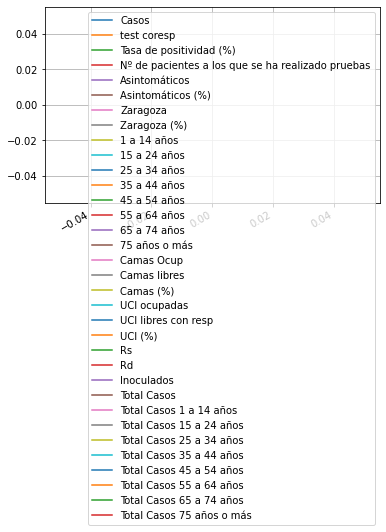

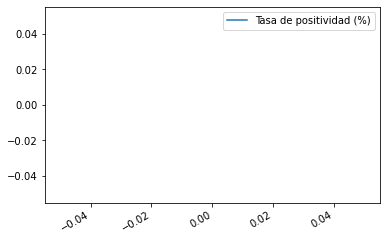

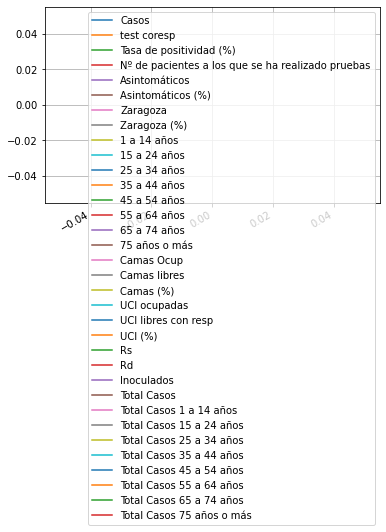

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-15     5.442177
2021-09-16     4.538259
2021-09-17     4.590818
2021-09-18     4.129993
2021-09-19     5.585980
Length: 354, dtype: float64

<AxesSubplot:xlabel='Fecha'>

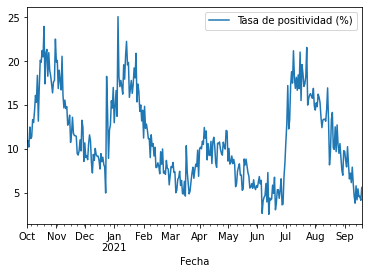

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,3.0,-28.927313,16.142517,-47.184834,-35.117888,-23.050941,-19.798552,-16.546163
15 a 24 años,3.0,111.473989,21.271971,87.134607,103.958006,120.781405,123.643680,126.505955
25 a 34 años,3.0,-48.133563,17.273542,-67.558295,-54.950940,-42.343586,-38.421198,-34.498810
35 a 44 años,3.0,13.463930,53.380927,-21.569263,-17.254730,-12.940197,30.980527,74.901250
45 a 54 años,3.0,-35.244331,15.225416,-51.687249,-42.049319,-32.411388,-27.022872,-21.634356
55 a 64 años,3.0,-61.230541,14.659073,-77.144973,-67.705976,-58.266979,-53.273325,-48.279672
65 a 74 años,3.0,-11.355984,21.079295,-35.679023,-17.833288,0.012448,0.805535,1.598623
75 años o más,3.0,-25.347325,43.588197,-62.859333,-49.256052,-35.652771,-6.591321,22.470129
Asintomáticos,4.0,-29.005272,11.127923,-38.421769,-35.440752,-32.236876,-25.801395,-13.125567
Asintomáticos (%),4.0,-14.357505,5.301147,-21.492915,-16.684846,-13.251932,-10.924591,-9.433241


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-09-20    1938.0
2021-09-21    2000.0
2021-09-22    1969.0
2021-09-23       NaN
2021-09-24       NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

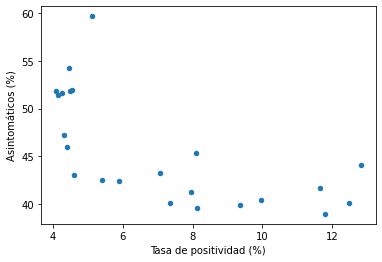

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

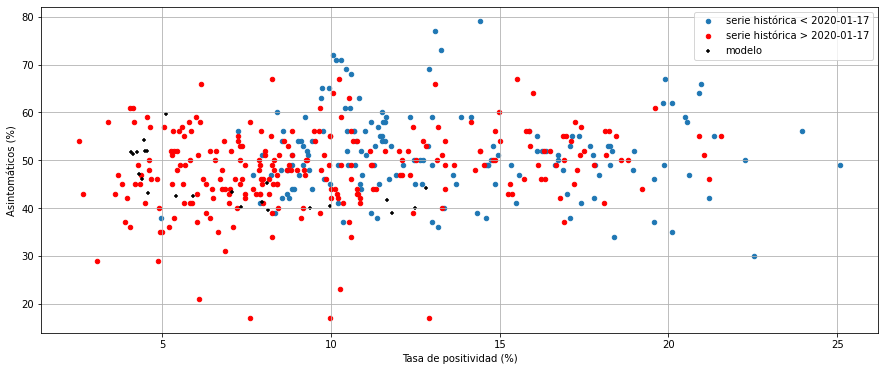

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,128.000000,8.600000e+01,92.000000,61.000000,51.000000,89.000000,130.000000,83.000000,8.800000e+01,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2352.000000,1.895000e+03,2004.000000,1477.000000,913.000000,2203.000000,2577.000000,2454.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,2166.000000,1.981000e+03,2134.000000,994.000000,947.000000,1938.000000,2000.000000,1969.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,5.440000,4.540000e+00,4.590000,4.130000,5.590000,4.040000,5.040000,3.380000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,66.560000,5.074000e+01,46.000000,37.210000,29.070000,54.290000,74.100000,48.140000,5.808000e+01,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,97.000000,6.000000e+01,68.000000,41.000000,27.000000,44.000000,105.000000,67.000000,6.200000e+01,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,39.000000,9.000000e+00,18.000000,11.000000,5.000000,15.000000,34.000000,18.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,12.000000,9.000000e+00,9.000000,3.000000,6.000000,3.000000,5.000000,8.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,7.000000,6.000000e+00,14.000000,6.000000,2.000000,9.000000,20.000000,9.000000,NaN,NaN


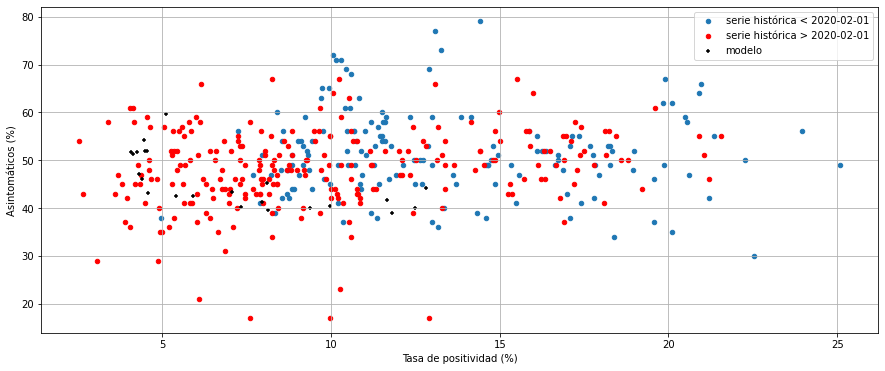

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.00000,0.16404
Asintomáticos (%),0.16404,1.00000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

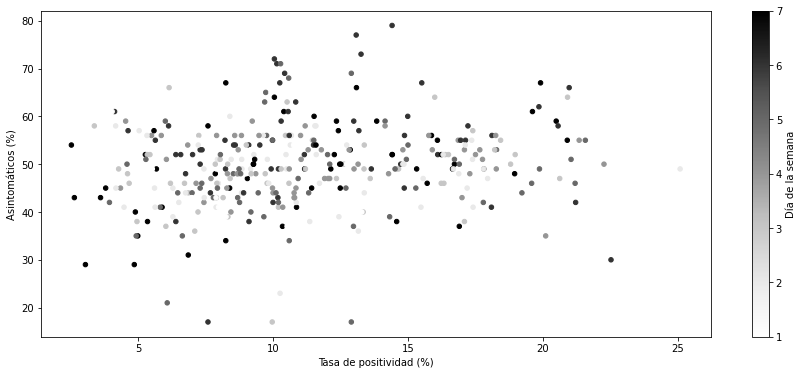

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,...,2021-10-01,2021-10-02,2021-10-03,2021-10-04,2021-10-05,2021-10-06,2021-10-07,2021-10-08,2021-10-09,2021-10-10
Casos,75.875962,46.602587,65.912837,85.688156,78.261984,74.144518,67.755257,52.614203,36.996175,64.958108,...,170.700302,150.318220,110.875064,192.752077,309.357440,345.040616,388.012243,401.884052,333.325882,234.008707
test coresp,1499.434225,1035.197560,1690.253484,2193.602317,2200.001270,2022.559216,1998.049856,1483.388408,1017.775296,1669.395634,...,2069.676751,1565.499124,1098.182908,1845.917354,2475.612722,2570.377675,2446.044988,2496.384609,1907.850348,1346.151900
Tasa de positividad (%),5.116397,4.464282,4.084889,4.241754,4.124962,4.489222,4.314256,4.534409,4.405764,4.582807,...,7.343383,8.099147,7.950384,8.140416,9.370270,9.963224,11.653105,11.804537,12.819815,12.492818
Nº de pacientes a los que se ha realizado pruebas,1076.690933,742.918633,2046.706859,2003.502775,1900.253499,1717.100283,1755.402764,910.549409,666.056095,1925.656746,...,1902.387205,1000.356103,740.253175,2166.349923,2230.980225,2201.989592,2048.435206,2134.896941,1119.485335,828.379249
Asintomáticos,45.176718,27.282378,37.988520,48.574714,41.821352,35.764636,25.174586,17.435636,9.161011,13.999317,...,48.362598,54.335846,40.608526,72.762498,123.498048,145.175967,173.537174,172.731785,166.384820,108.633380
Asintomáticos (%),59.656151,54.284159,51.799884,51.623053,51.375410,51.814676,47.192193,51.918659,46.041761,43.048995,...,40.126616,45.324366,41.305934,39.598312,39.945047,40.472373,41.737726,38.995962,44.115615,40.086724
Zaragoza,54.130588,31.905266,42.885928,61.337897,57.156289,53.415193,48.190862,38.372682,25.129514,41.029804,...,115.865892,106.120214,73.371761,118.560598,206.275580,232.854331,258.111037,265.820833,229.344138,150.818251
Zaragoza (%),69.988693,66.684149,62.742265,68.192402,69.741891,69.372397,69.213655,71.325720,67.045583,62.356564,...,67.225882,69.323282,65.306862,60.762681,65.431396,66.395671,65.599189,65.063862,66.702777,62.269115
1 a 14 años,17.404057,8.277999,11.542359,17.957156,15.021691,12.882625,10.503257,6.842723,2.939848,3.911916,...,5.996051,5.427001,3.260232,6.038922,12.825221,14.843678,17.732419,20.217537,18.459986,10.789851
15 a 24 años,6.861946,4.237937,6.623442,11.325298,14.970769,19.655256,24.804294,23.107228,18.195861,35.489012,...,100.757382,78.777588,52.357798,87.574224,141.466233,159.663192,169.451357,169.994445,126.451946,81.195514


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

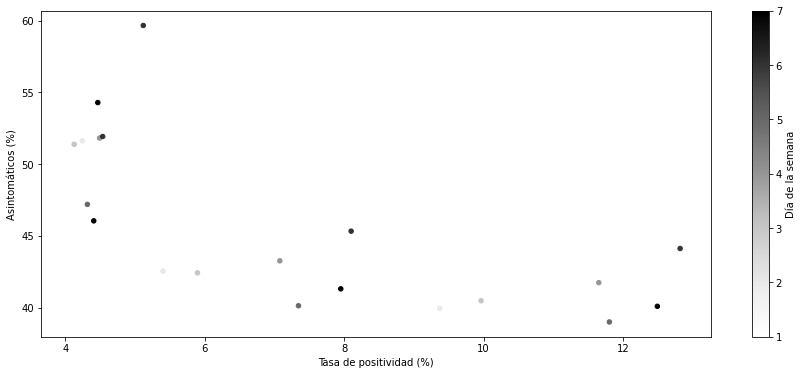

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

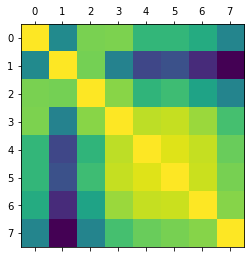

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

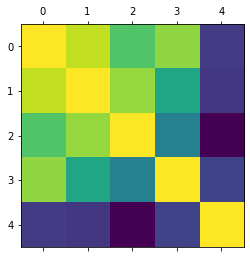

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

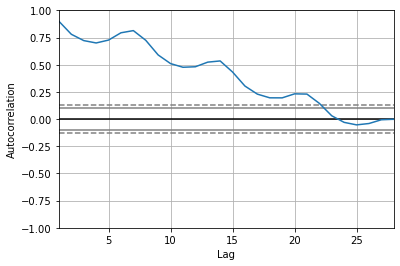

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

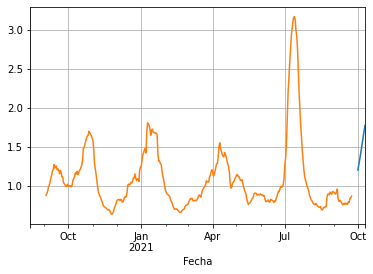

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

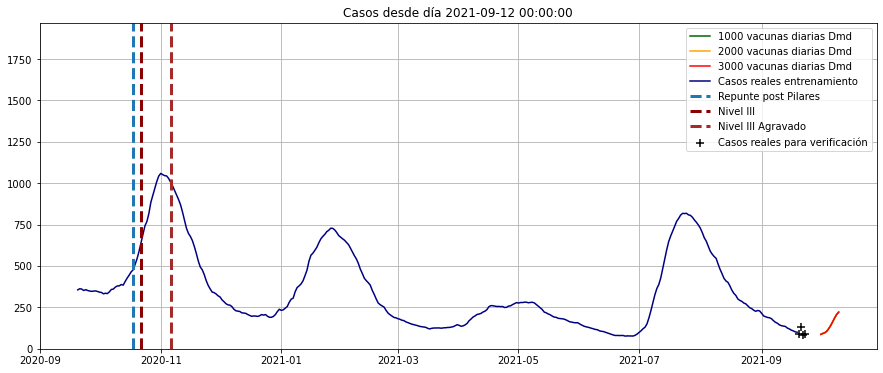

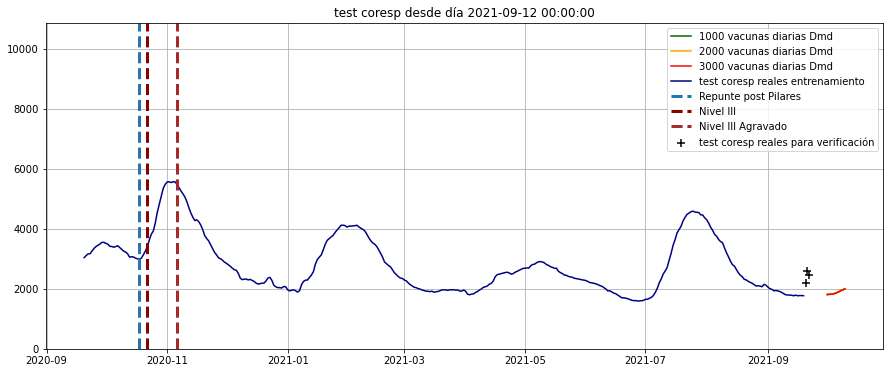

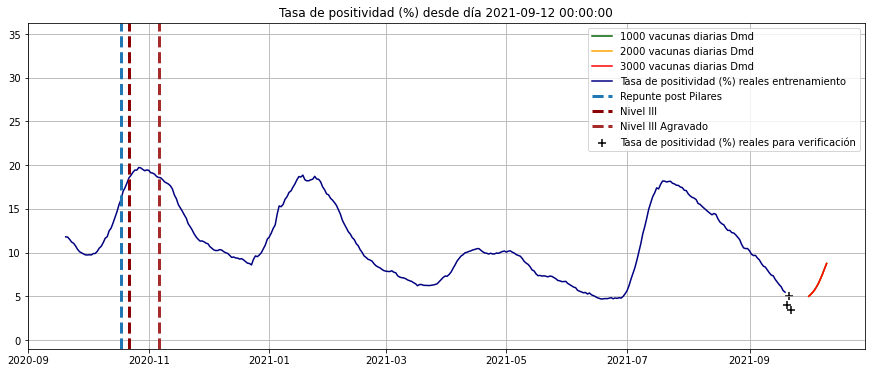

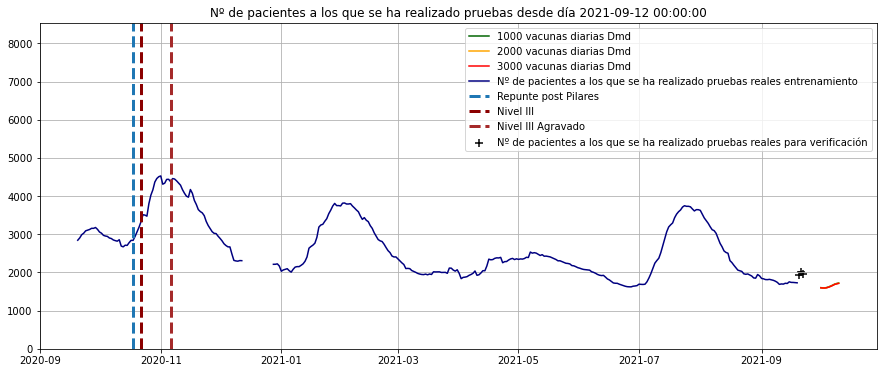

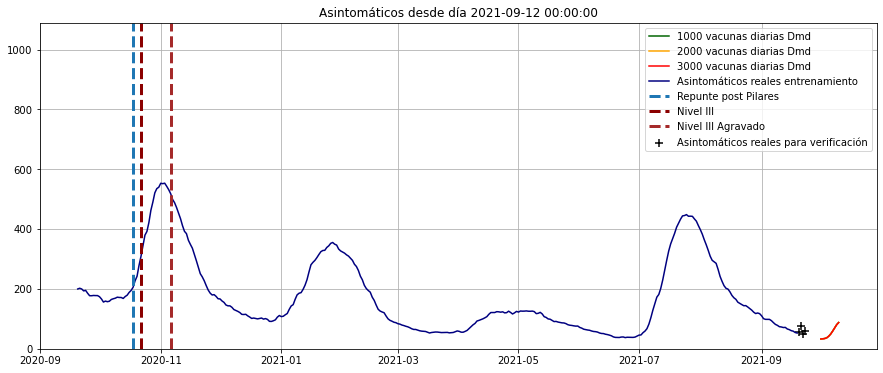

...

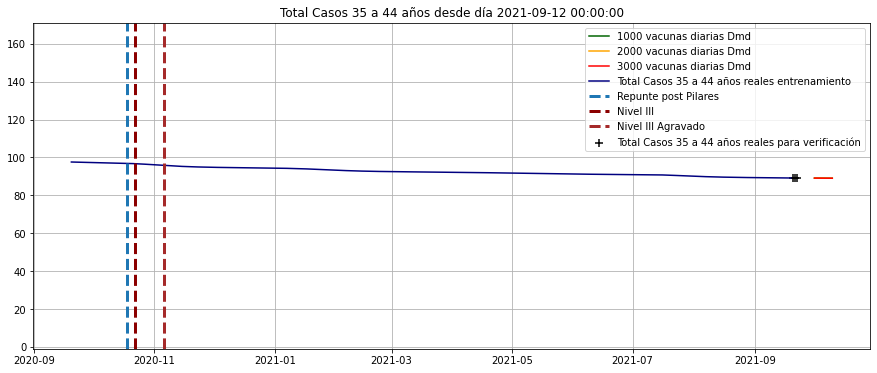

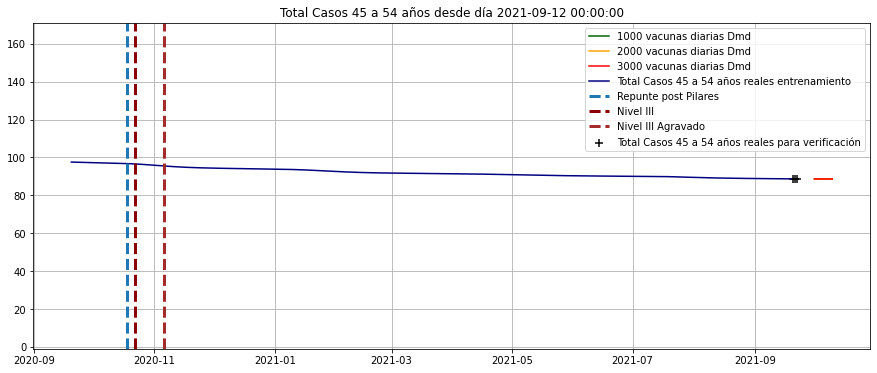

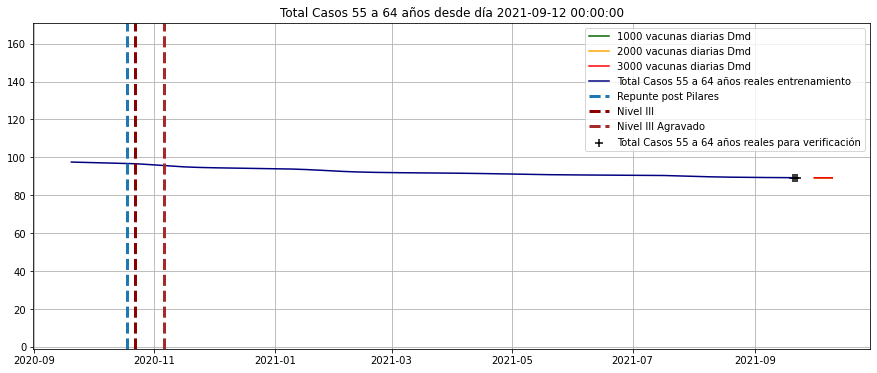

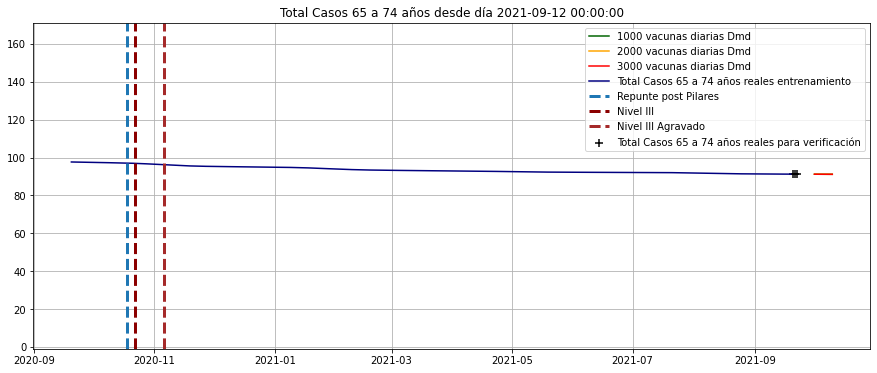

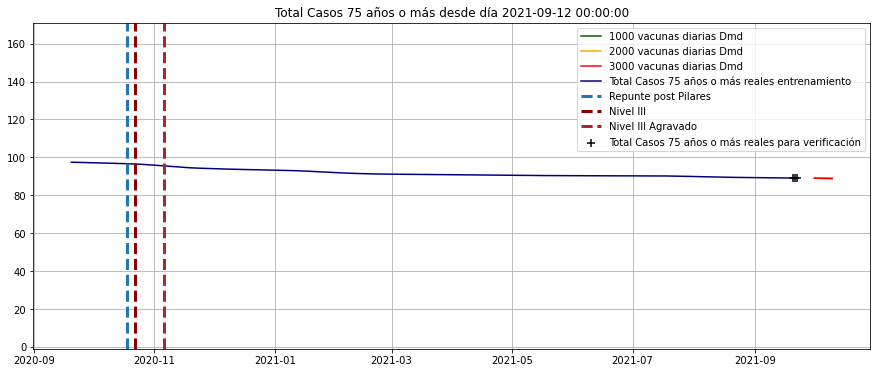

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

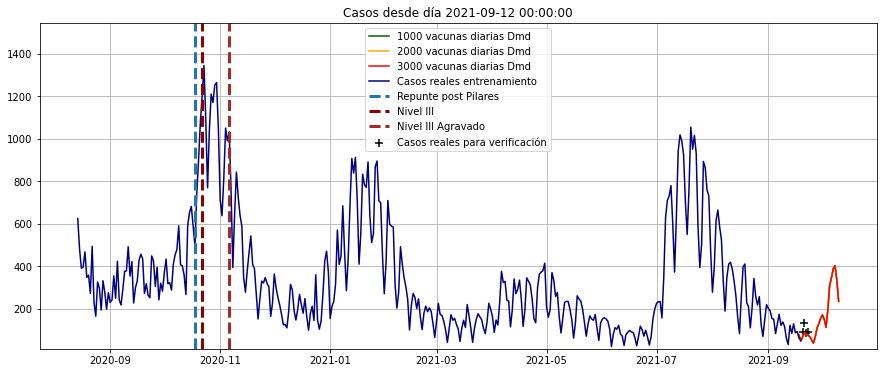

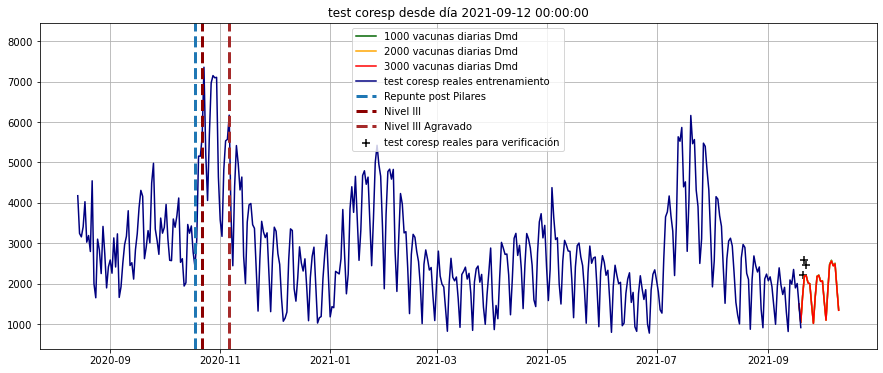

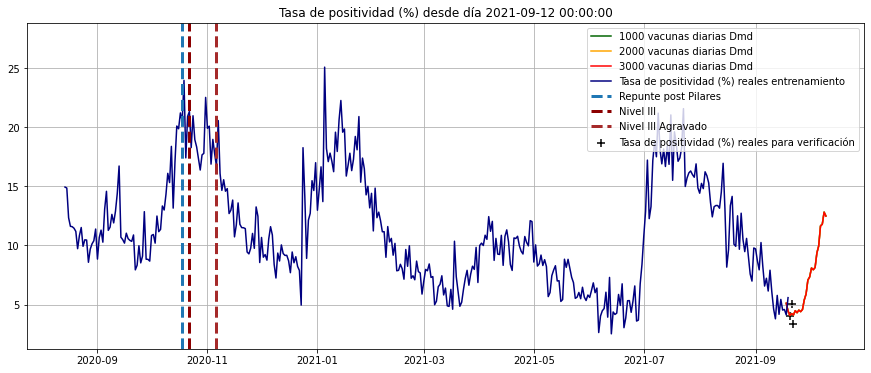

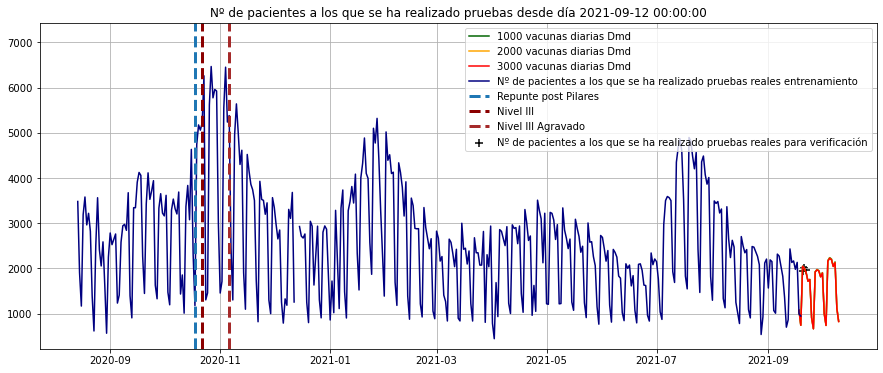

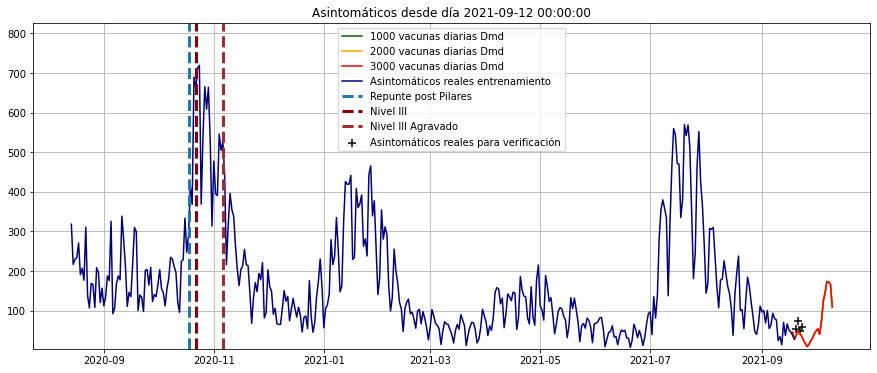

...

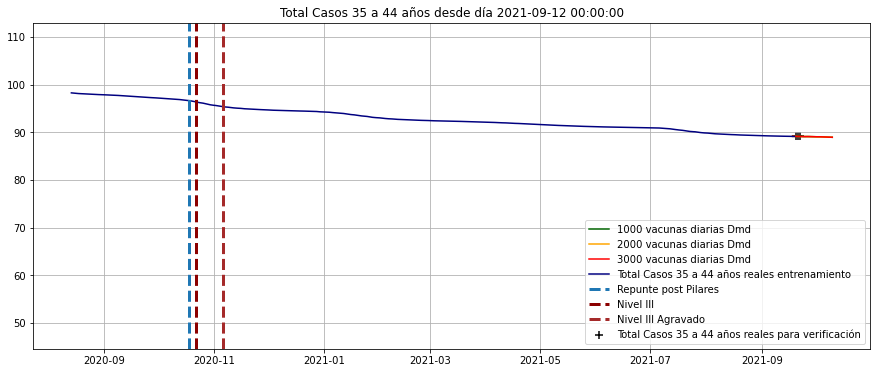

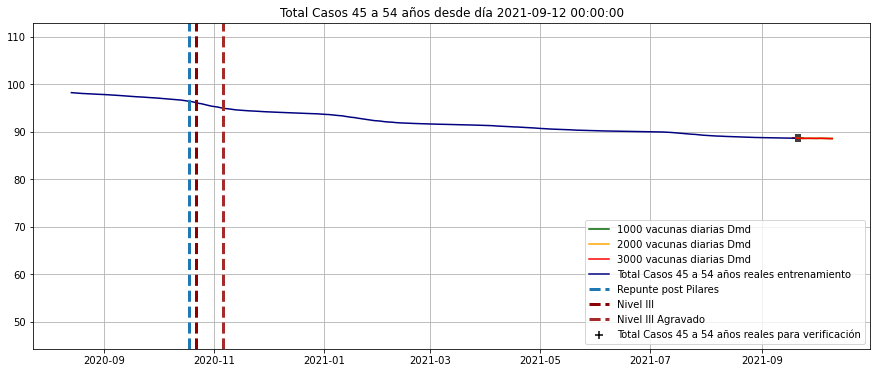

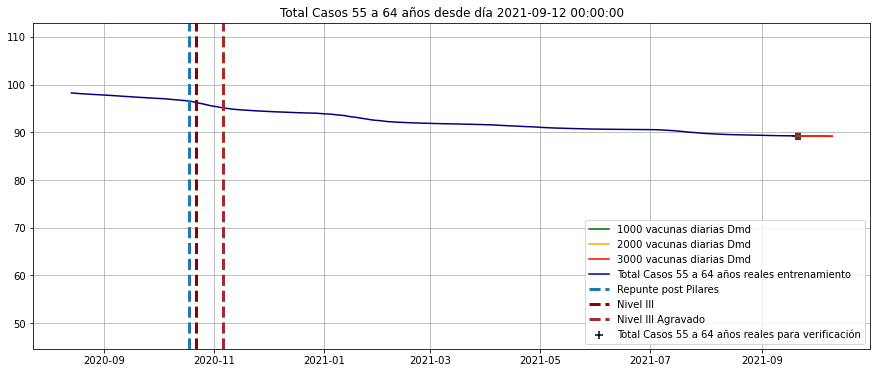

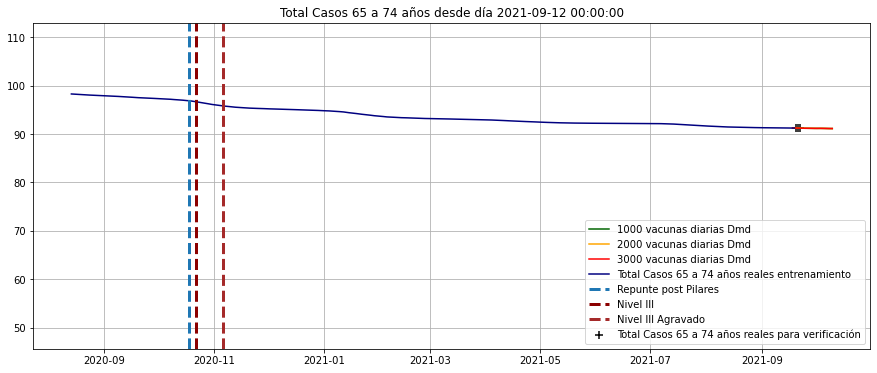

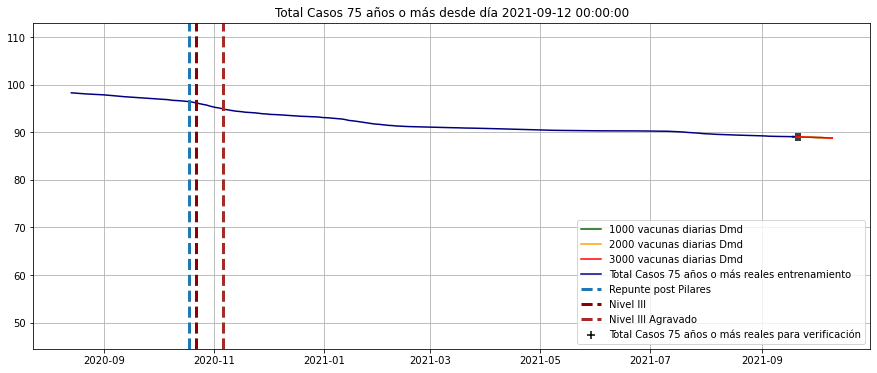

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Fecha,,,,
2021-03-19,-0.000652,0.000060,7.254584e-06,0.000328
2021-03-20,-0.000885,0.000108,-4.875047e-05,0.001796
2021-03-21,-0.000479,0.000036,-3.683150e-06,0.001026
2021-03-22,-0.001127,0.000092,3.367971e-05,-0.000366
2021-03-23,-0.001234,0.000166,-2.271591e-05,-0.000903
2021-03-24,-0.000944,0.000135,-2.085278e-05,-0.000761
2021-03-25,-0.000433,0.000038,4.357593e-06,0.000499
2021-03-26,-0.001111,0.000165,-3.183031e-05,-0.001022
2021-03-27,0.000046,-0.000109,1.199182e-04,-0.000126


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Casos,1.017083,-0.082718,0.065737,1.055185


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-09-22
Casos,83.0
test coresp,2454.0
Nº de pacientes a los que se ha realizado pruebas,1969.0
Asintomáticos (%),58.0


Fecha,2021-09-23
Casos,72.064648


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,177.732637


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,335.316930
2021-04-18,209.537658
2021-04-19,118.774980
2021-04-20,256.495909


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,394.823012
2020-08-17,396.0,274.475073
2020-08-18,467.0,392.753203
2020-08-19,347.0,438.246145
2020-08-20,357.0,355.354430
...,...,...
2021-09-19,51.0,69.576279
2021-09-20,89.0,98.748208
2021-09-21,130.0,100.057155


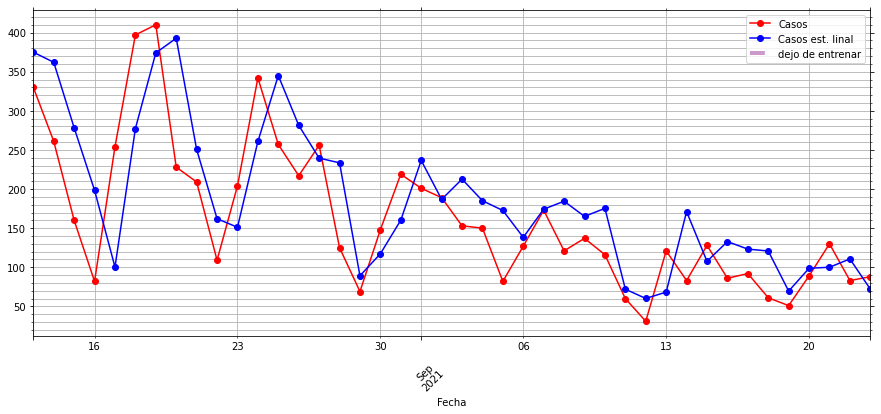

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

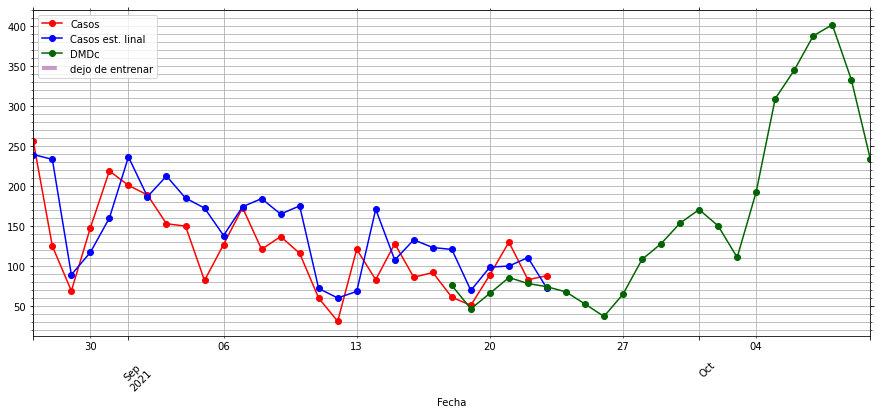

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(3.1290696496212727, 104.6561909123947)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

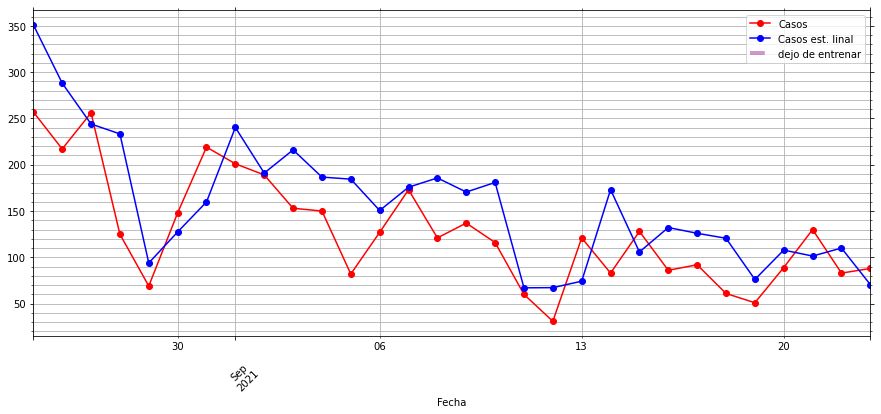

(-1.15324800425843, 104.64745097578188)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-09 00:00:00 6.11364283005599 104.65029183881234
2021-03-10 00:00:00 6.8952217389189245 104.78734113629021
2021-03-11 00:00:00 7.094820161502953 104.85632351827905
2021-03-12 00:00:00 7.325178712607881 105.02866536420123
2021-03-13 00:00:00 8.99072117316543 105.62583435306182
2021-03-14 00:00:00 10.017340891447233 106.19152457433148
2021-03-15 00:00:00 9.592760343943665 105.77991560958513
2021-03-16 00:00:00 11.036115968673569 106.48032703733386
2021-03-17 00:00:00 13.362076915607075 108.25080265072076
2021-03-18 00:00:00 5.747147512565394 104.77699068136778
2021-03-19 00:00:00 2.8984972034401504 104.62837656683745
2021-03-20 00:00:00 4.734114939946663 105.37499874583986
2021-03-21 00:00:00 8.083403152866037 108.00583284809414
2021-03-22 00:00:00 6.912827697594796 106.97482979037196
2021-03-23 00:00:00 8.086081299891141 107.75977716731511
2021-03-24 00:00:00 6.979089272268016 106.99625206033477
2021-03-25 00:00:00 8.673492620209059 108.33769678010384
2021-03-26 00:00:00 9.974766

2021-08-02 00:00:00 344.2903225806452 265.6226751481899
2021-08-03 00:00:00 344.2903225806452 265.6226751481899
2021-08-04 00:00:00 344.2903225806452 265.6226751481899
2021-08-05 00:00:00 344.2903225806452 265.6226751481899
2021-08-06 00:00:00 344.2903225806452 265.6226751481899
2021-08-07 00:00:00 344.2903225806452 265.6226751481899
2021-08-08 00:00:00 344.2903225806452 265.6226751481899
2021-08-09 00:00:00 344.2903225806452 265.6226751481899
2021-08-10 00:00:00 344.2903225806452 265.6226751481899
2021-08-11 00:00:00 344.2903225806452 265.6226751481899
2021-08-12 00:00:00 344.2903225806452 265.6226751481899
2021-08-13 00:00:00 344.2903225806452 265.6226751481899
2021-08-14 00:00:00 344.2903225806452 265.6226751481899
2021-08-15 00:00:00 344.2903225806452 265.6226751481899
2021-08-16 00:00:00 344.2903225806452 265.6226751481899
2021-08-17 00:00:00 344.2903225806452 265.6226751481899
2021-08-18 00:00:00 344.2903225806452 265.6226751481899
2021-08-19 00:00:00 344.2903225806452 265.622675

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-11 00:00:00 3.6585260204866668 104.84839804969154
2021-07-12 00:00:00 -4.466804315213145 106.20064664645922
2021-07-13 00:00:00 -9.586381596161797 107.44320394905236
2021-07-14 00:00:00 -7.94437223015081 106.97060654298697
2021-07-15 00:00:00 -7.73879382031121 106.9221199213425
2021-07-16 00:00:00 -1.7316495887011922 105.96769734473979
2021-07-17 00:00:00 -2.483134028307559 105.79971625082389
2021-07-18 00:00:00 -7.054720549114842 105.75486449227067
2021-07-19 00:00:00 -11.199463498638801 107.0229898281875
2021-07-20 00:00:00 -10.329933078114324 106.78554998239707
2021-07-21 00:00:00 -11.995161872855238 107.22641913201717
2021-07-22 00:00:00 -11.361545851983726 107.0604125807349
2021-07-23 00:00:00 -2.7411580374723967 105.16906851042395
2021-07-24 00:00:00 -1.6451566806998184 105.17223324481442
2021-07-25 00:00:00 -2.9219991418171056 105.10243533263103
2021-07-26 00:00:00 -6.7231718031098575 105.76604546392603
2021-07-27 00:00:00 -7.029708015158331 105.82206335871322
2021-07-28

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-06-19,2021-06-20,2021-06-21,2021-06-22,2021-06-23,2021-06-24,2021-06-25,2021-06-26,2021-06-27,2021-06-28,...,2021-09-10,2021-09-11,2021-09-12,2021-09-13,2021-09-14,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19
Casos,63.0,25.0,68.0,117.0,100.0,70.0,98.0,66.0,28.0,68.0,...,116.0,60.0,31.0,121.0,83.0,128.0,86.0,92.0,61.0,51.0
test coresp,932.0,820.0,1752.0,2196.0,1874.0,1610.0,1851.0,1003.0,776.0,1843.0,...,1909.0,1295.0,816.0,2092.0,1988.0,2352.0,1895.0,2004.0,1477.0,913.0
Nº de pacientes a los que se ha realizado pruebas,1073.0,796.0,2091.0,2102.0,1959.0,1632.0,1622.0,964.0,836.0,2342.0,...,1366.0,701.0,864.0,2432.0,2132.0,2166.0,1981.0,2134.0,994.0,947.0
Asintomáticos (%),48.0,29.0,37.0,56.0,52.0,45.0,51.0,52.0,43.0,47.0,...,21.0,57.0,45.0,58.0,45.0,52.0,59.0,50.0,61.0,57.0
Casos$^{{-\Delta t}}$,88.0,63.0,25.0,68.0,117.0,100.0,70.0,98.0,66.0,28.0,...,137.0,116.0,60.0,31.0,121.0,83.0,128.0,86.0,92.0,61.0
test coresp$^{{-\Delta t}}$,1784.0,932.0,820.0,1752.0,2196.0,1874.0,1610.0,1851.0,1003.0,776.0,...,1732.0,1909.0,1295.0,816.0,2092.0,1988.0,2352.0,1895.0,2004.0,1477.0
Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,1841.0,1073.0,796.0,2091.0,2102.0,1959.0,1632.0,1622.0,964.0,836.0,...,1828.0,1366.0,701.0,864.0,2432.0,2132.0,2166.0,1981.0,2134.0,994.0
Asintomáticos (%)$^{{-\Delta t}}$,35.0,48.0,29.0,37.0,56.0,52.0,45.0,51.0,52.0,43.0,...,56.0,21.0,57.0,45.0,58.0,45.0,52.0,59.0,50.0,61.0
Casos$^{-2\cdot \Delta t}$,90.0,88.0,63.0,25.0,68.0,117.0,100.0,70.0,98.0,66.0,...,121.0,137.0,116.0,60.0,31.0,121.0,83.0,128.0,86.0,92.0
test coresp$^{-2\cdot \Delta t}$,1537.0,1784.0,932.0,820.0,1752.0,2196.0,1874.0,1610.0,1851.0,1003.0,...,1966.0,1732.0,1909.0,1295.0,816.0,2092.0,1988.0,2352.0,1895.0,2004.0


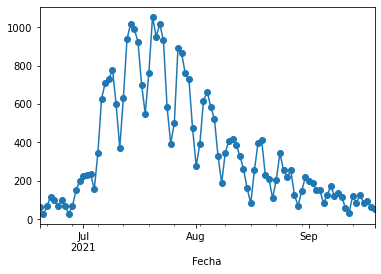

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
                   'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 14
entrenoDesde = '2021-06-19'
entrenoHasta = '2021-09-19'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-06-19,-0.000081,-0.000045,2.484429e-05,-0.000297,0.000059,0.000043,0.000035,0.000333,-0.000073,-0.000003,...,0.000014,-0.001857,0.000251,0.000066,-5.053186e-06,-0.002093,-0.000234,-0.000003,-1.035759e-05,-0.002198
2021-06-20,0.000296,0.000021,-2.390218e-05,-0.004170,-0.000412,-0.000006,0.000010,0.001215,0.000161,0.000031,...,0.000053,-0.000158,-0.000571,0.000099,-4.777912e-06,-0.001317,-0.000041,0.000013,4.111413e-05,-0.002806
2021-06-21,-0.000407,0.000086,1.982322e-06,-0.001566,0.000456,0.000007,-0.000029,-0.004169,-0.000278,-0.000032,...,-0.000040,-0.000313,-0.000268,-0.000076,6.696715e-05,0.000226,-0.000220,0.000076,3.355708e-06,-0.002020
2021-06-22,-0.000189,0.000060,-4.434803e-05,0.003108,-0.000600,0.000099,0.000008,-0.001901,0.000616,-0.000007,...,0.000001,0.001398,0.000045,0.000021,-2.723641e-05,-0.001076,0.000082,-0.000082,5.746818e-05,-0.000830
2021-06-23,-0.000259,-0.000023,-1.296303e-05,0.001054,0.000199,0.000033,-0.000001,0.002861,-0.000687,0.000115,...,0.000006,-0.000418,-0.000379,0.000126,-3.489367e-05,0.000294,-0.000034,-0.000007,-1.400917e-05,-0.000302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-15,-0.000306,0.000092,-7.644497e-07,-0.000980,-0.000330,-0.000058,0.000058,-0.001020,0.000271,0.000003,...,0.000023,0.004092,-0.000202,-0.000074,3.097950e-05,-0.001204,0.000097,0.000036,1.681287e-05,-0.000258
2021-09-16,-0.000433,0.000079,1.931194e-05,0.000682,-0.000220,0.000079,-0.000007,-0.001575,-0.000196,-0.000082,...,0.000004,0.001762,-0.000107,-0.000039,5.624328e-05,0.003712,0.000275,-0.000055,6.692419e-07,-0.001989
2021-09-17,-0.000255,0.000084,-3.245116e-05,-0.000738,-0.000394,0.000073,0.000015,0.000778,-0.000058,0.000068,...,0.000050,-0.000504,0.000018,-0.000033,-2.348438e-07,0.000854,0.000108,-0.000077,6.752710e-05,0.003327


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Casos,1.218599,-0.087603,0.071472,-2.428415,-0.289348,0.052031,-0.102013,0.44804,0.356136,-0.021921,...,-0.005547,-1.282124,0.082639,-0.01932,0.007046,2.042117,-0.5154,0.075951,-0.017433,1.055752


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,2641.0,48.0,334.0,3634.0,3070.0,48.0,370.0,4377.0,...,1051.0,50.0,152.0,1599.0,1624.0,54.0,245.0,2456.0,963.0,55.0


,Casos est. lineal
Fecha,
2021-05-07,187.881031


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-06-24     70.0
2021-06-25     98.0
2021-06-26     66.0
2021-06-27     28.0
2021-06-28     68.0
              ...  
2021-09-19     51.0
2021-09-20     89.0
2021-09-21    130.0
2021-09-22     83.0
2021-09-23     88.0
Name: Casos, Length: 92, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-06-24,92.358781
2021-06-25,113.822076
2021-06-26,77.673033
2021-06-27,74.600018
2021-06-28,137.194670
...,...
2021-09-19,-27.277815
2021-09-20,72.781643
2021-09-21,105.409275


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-09-22'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-06-24,70.0,92.358781
2021-06-25,98.0,113.822076
2021-06-26,66.0,77.673033
2021-06-27,28.0,74.600018
2021-06-28,68.0,137.194670
...,...,...
2021-09-19,51.0,-27.277815
2021-09-20,89.0,72.781643
2021-09-21,130.0,105.409275


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-06-24 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-09-18,61.0,50.576983,75.875962
2021-09-19,51.0,-27.277815,46.602587
2021-09-20,89.0,72.781643,65.912837
2021-09-21,130.0,105.409275,85.688156
2021-09-22,83.0,173.237949,78.261984
2021-09-23,88.0,-9.350920,74.144518
2021-09-24,NaN,NaN,67.755257
2021-09-25,NaN,NaN,52.614203
2021-09-26,NaN,NaN,36.996175
2021-09-27,NaN,NaN,64.958108


(1.1857475243147382, 41.00757257183435)

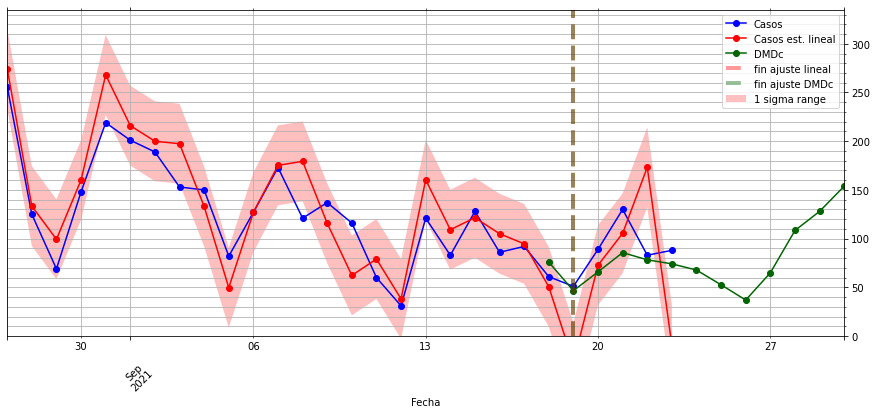

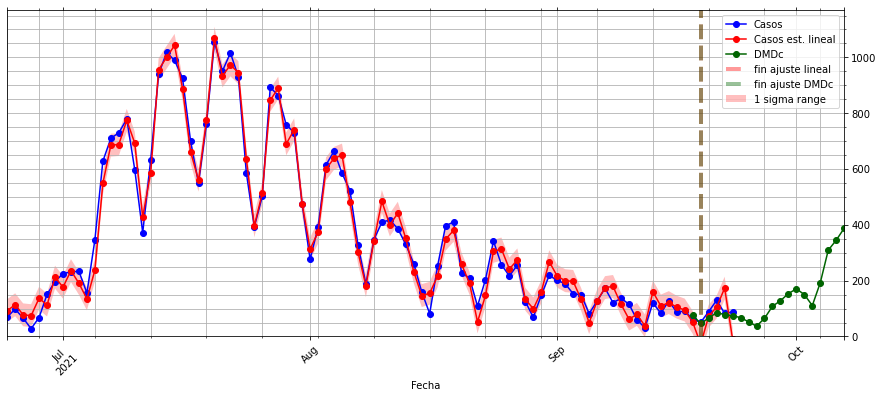

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

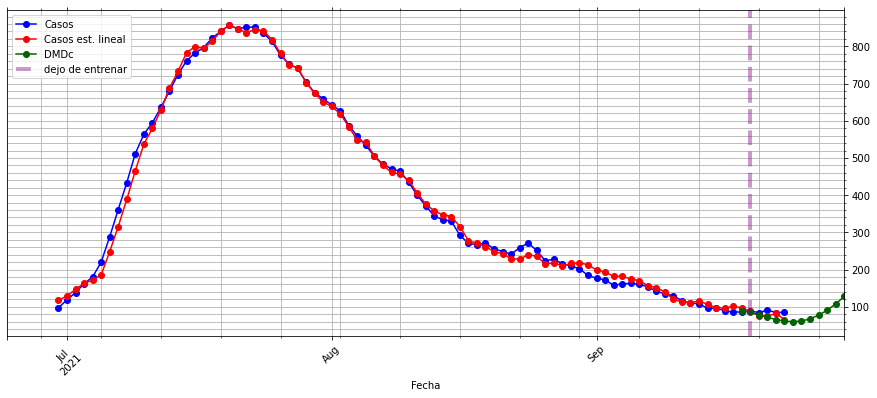

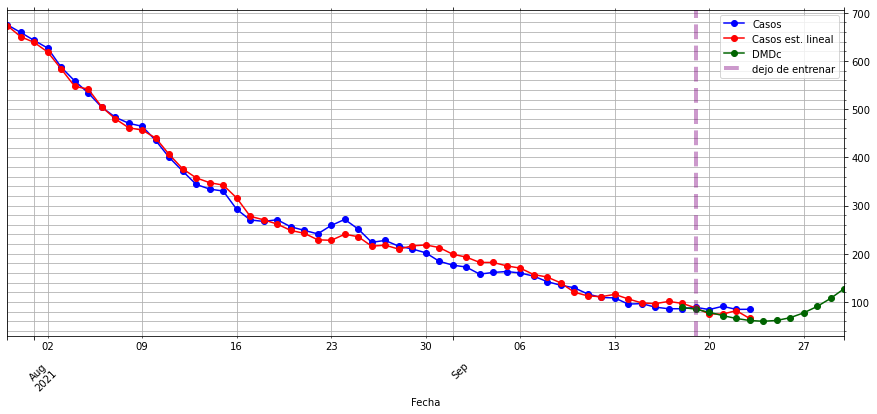

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(1.1857475243147382, 41.00757257183435)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

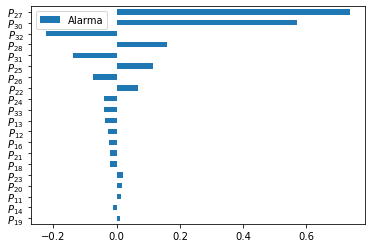

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

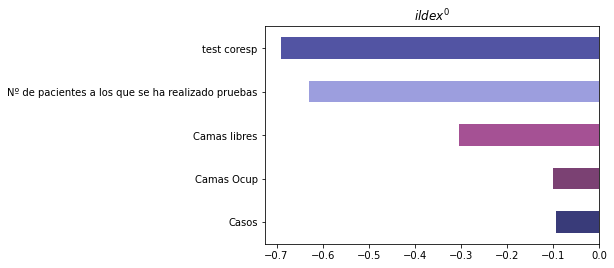

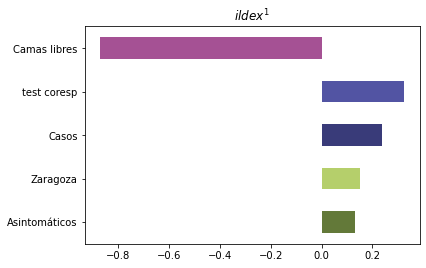

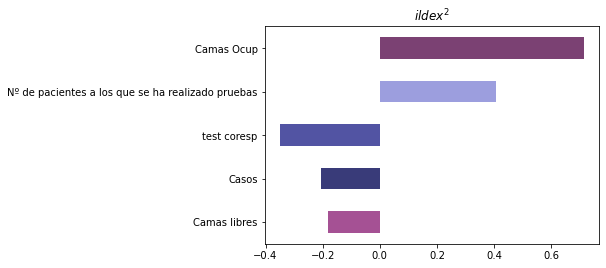

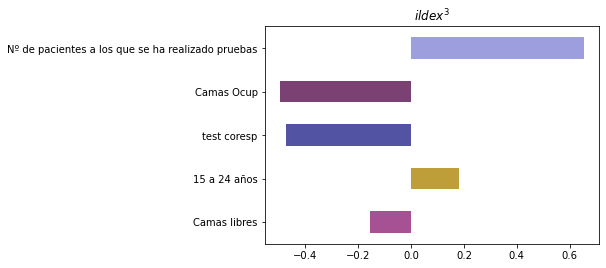

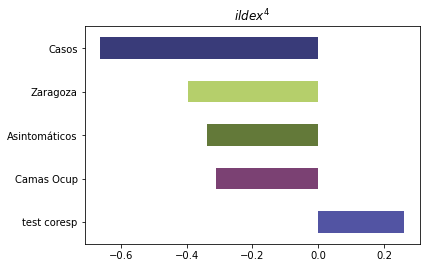

...

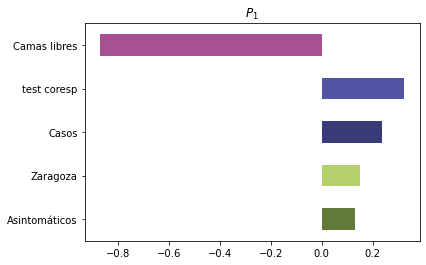

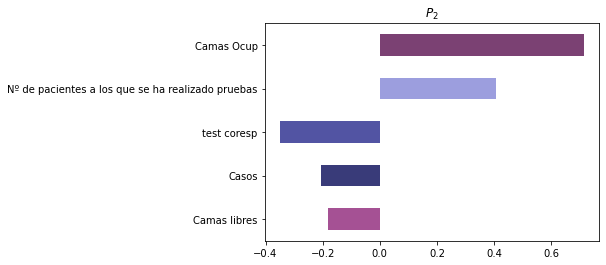

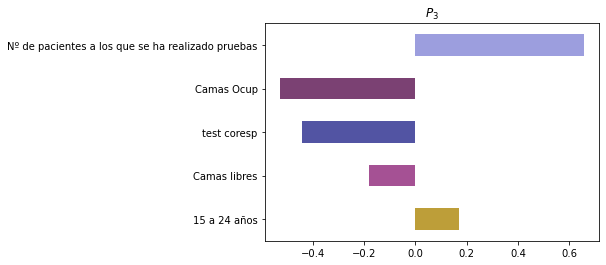

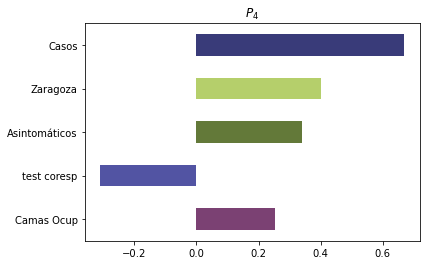

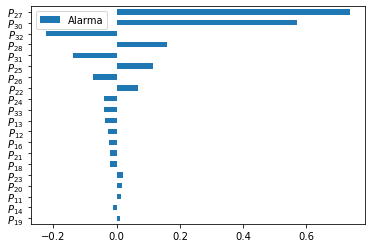

KeyError: 'Total Casos 65 a 74 años'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes